# Executive Summary

## Approach

1. First, we will conduct EDA to get a feel for *labeled* predictors, to understand what kind of transformations if any are necessary, to determine features irrelevant to pump-failure classification, etc.  One important note: **since our ultimate goal is to build a classification model, we know ahead of time that we will probably be using a model based on Decision Trees... probably gradient-boosted Decision Trees - e.g. `RandomForestClassifier` or `XGBClassifier`; so we will conduct data transformations accordingly - for example, in the case of high-cardinality categorical variables, gradient-boosted decision tree classifiers generally do not work well when such categorical variables are One-Hot Encoded**
2. As we go, we will create data "transmformation" rules output from the above insights; these rules will be used by `Tranformer` objects which will then be added to an sklean `Pipeline`.
3. These rules will first be applied to all *labeled* predictors/data.
4. We will then split *labeled* data into *training* and *validation* partitions.
5. We will build classification models on the *training* partition and then use the *validation* partition for model scoring and evaluation (since we have corresponding labels).
6. We will select the best model based on the above to then apply the `Pipeline`d transformations to the *unlabeled* predictors/data, in order to produce our final set of labels predicted from the *unlabeled* data, for submission to the competition repository.

# Import Libraries

In [1]:
import scjpnlib.utils as scjpnutils
import os
import pandas as pd
import numpy as np
from scjpnlib.utils.file_io import FileManager
from IPython.core.display import HTML, Markdown
import matplotlib.pyplot as plt

from sklearn.pipeline import Pipeline
from scjpnlib.utils.skl_transformers import DropColumnsTransformer, LambdaTransformer, SimpleValueTransformer, OneHotEncodingTransformer, LabelEncodingTransformer, TargetEncoderLOOTransformer
from scjpnlib.utils.skl_transformers import fit_target_encoder, target_encoder_transform
from sklearn.preprocessing import FunctionTransformer
from sklearn.model_selection import StratifiedKFold

from scjpnlib.utils import submodels as scjpnsubmodels

from sklearn.model_selection import train_test_split

%load_ext autoreload
%autoreload 2

# Load/Read Config

The following reads properties from the `eda-config.txt` file as JSON.  (see the `eda-config.txt` file for documentation on config parameters)

In [2]:
fm = FileManager()
eda_config = fm.load_json('eda-config.txt')
eda_config

{'official_data': {'unlabeled_predictors': {'url': 'https://s3.amazonaws.com/drivendata-prod/data/7/public/702ddfc5-68cd-4d1d-a0de-f5f566f76d91.csv',
   'local_fname': 'Taarifa-Unlabeled-Predictors.csv'},
  'labeled_predictors': {'url': 'https://s3.amazonaws.com/drivendata-prod/data/7/public/4910797b-ee55-40a7-8668-10efd5c1b960.csv',
   'local_fname': 'Taarifa-Labeled-Predictors.csv'},
  'labels': {'url': 'https://s3.amazonaws.com/drivendata-prod/data/7/public/0bf8bc6e-30d0-4c50-956a-603fc693d966.csv',
   'local_fname': 'Taarifa-Labels.csv'}},
 'eda_desc': {'short': '0.10 test_ratio'},
 'test_ratio': 0.1,
 'SEED': 42,
 'target_encoding': {'post_encode_null_to_global_mean': True,
  'train': {'leave_one_out': False}},
 'variable_transformation_strategies': {'amount_tsh': 'C__drop_it__StrategyTransformer',
  'funder': 'C__target_encode__not_LOO__post_encode_null_to_global_mean__StrategyTransformer',
  'installer': 'C__target_encode__not_LOO__post_encode_null_to_global_mean__StrategyTransf

In [3]:
if len(eda_config['wrangled_data']['dir']) > 0:
    WRANGLED_DATA_DIR = eda_config['wrangled_data']['dir']
    try:
        os.makedirs(f"{os.getcwd()}/{WRANGLED_DATA_DIR}")
    except FileExistsError:
        pass
    WRANGLED_DATA_DIR += "/"
else:
    WRANGLED_DATA_DIR = ""

if len(eda_config['labels']['dir']) > 0:
    SAVE_LABELS_DIR = eda_config['labels']['dir']
    try:
        os.makedirs(f"{os.getcwd()}/{SAVE_LABELS_DIR}")
    except FileExistsError:
        pass
    SAVE_LABELS_DIR += "/"
else:
    SAVE_LABELS_DIR = ""

    
fname__train_predictors = WRANGLED_DATA_DIR + scjpnutils.get_data_fname(eda_config, data_kwargs={'is_labels':False,'type':'train'})
print(f"wrangled training predictors will be saved to: {fname__train_predictors}")
fname__train_labels = SAVE_LABELS_DIR + scjpnutils.get_data_fname(eda_config, data_kwargs={'is_labels':True,'type':'train'})
print(f"training labels will be saved to: {fname__train_labels}")

fname__validation_predictors = WRANGLED_DATA_DIR + scjpnutils.get_data_fname(eda_config, data_kwargs={'is_labels':False,'type':'test'})
print(f"wrangled validation predictors will be saved to: {fname__validation_predictors}")
fname__validation_labels = SAVE_LABELS_DIR + scjpnutils.get_data_fname(eda_config, data_kwargs={'is_labels':True,'type':'test'})
print(f"validation labels will be saved to: {fname__validation_labels}")

fname__unlabeled_predictors = WRANGLED_DATA_DIR + scjpnutils.get_data_fname(eda_config, data_kwargs={'is_labels':False,'type':'unlabeled'})
print(f"wrangled unlabeled predictors will be saved to: {fname__unlabeled_predictors}")

wrangled training predictors will be saved to: preprocessing-results/wrangled-labeled-data-train-f80977aa7a9e6efea5f616e668b6cc19.csv
training labels will be saved to: preprocessing-results/labels-train-f80977aa7a9e6efea5f616e668b6cc19.csv
wrangled validation predictors will be saved to: preprocessing-results/wrangled-labeled-data-test-f80977aa7a9e6efea5f616e668b6cc19.csv
validation labels will be saved to: preprocessing-results/labels-test-f80977aa7a9e6efea5f616e668b6cc19.csv
wrangled unlabeled predictors will be saved to: preprocessing-results/wrangled-unlabeled-data-f80977aa7a9e6efea5f616e668b6cc19.csv


In [4]:
display(HTML(f"<b>NOTE: <i>for the above EDA configuration, wrangled and partitioned label output files will be identified (filename suffix) by: hash digest: {scjpnutils.json_to_md5_hash_digest(eda_config)}</i></b>"))

# Obtain the Data: Labels, Labeled Predictors, and Unlabeled Predictors

In [5]:
fname_unlabeled_predictors = eda_config['official_data']['unlabeled_predictors']['local_fname']
fname_labeled_predictors = eda_config['official_data']['labeled_predictors']['local_fname']
fname_labels = eda_config['official_data']['labels']['local_fname']

ds_map = {
    fname_unlabeled_predictors: eda_config['official_data']['unlabeled_predictors']['url'], 
    fname_labeled_predictors: eda_config['official_data']['unlabeled_predictors']['url'],
    fname_labels: eda_config['official_data']['unlabeled_predictors']['url']
}

fm.validate_download(ds_map)

# Explore the Data

Before we get into our analysis, let's initialize some objects/variables that will be used throughout.

One thing to note: in keeping with the Approach outline above, we will be building the preprocessing `Pipeline` as we go.  

So let's take care of these initialization details now.

In [6]:
SEED = eda_config['SEED'] # for random_state reproducability

pipeline_data_preprocessor = Pipeline(steps=[('passthrough', None)], verbose=True)

In [7]:
labeled_with_target = pd.concat(
    [
        pd.read_csv(fname_labeled_predictors, index_col=0), 
        pd.read_csv(fname_labels, index_col=0)
    ], 
    axis=1
    ,
    join='inner'
).sort_index()

labeled_with_target

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,
0,0.0,2012-11-13,Tasaf,0,TASAF,33.125828,-5.118154,Mratibu,0,Lake Tanganyika,...,milky,milky,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,non functional
1,0.0,2011-03-05,Shipo,1978,SHIPO,34.770717,-9.395642,none,0,Rufiji,...,soft,good,enough,enough,shallow well,shallow well,groundwater,hand pump,hand pump,functional
2,0.0,2011-03-27,Lvia,0,LVIA,36.115056,-6.279268,Bombani,0,Wami / Ruvu,...,soft,good,insufficient,insufficient,machine dbh,borehole,groundwater,communal standpipe multiple,communal standpipe,functional
3,10.0,2013-06-03,Germany Republi,1639,CES,37.147432,-3.187555,Area 7 Namba 5,0,Pangani,...,soft,good,enough,enough,spring,spring,groundwater,communal standpipe,communal standpipe,functional
4,0.0,2011-03-22,Cmsr,0,CMSR,36.164893,-6.099289,Ezeleda,0,Wami / Ruvu,...,soft,good,dry,dry,shallow well,shallow well,groundwater,hand pump,hand pump,non functional
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
74240,0.0,2013-03-22,World Vision,1183,World vision,37.007726,-3.280868,Upendo Primary School,0,Pangani,...,soft,good,insufficient,insufficient,rainwater harvesting,rainwater harvesting,surface,communal standpipe,communal standpipe,functional
74242,0.0,2011-04-12,Danida,0,DANIDA,33.724987,-8.940758,Kwa Mvulula,0,Rufiji,...,soft,good,enough,enough,river,river/lake,surface,communal standpipe,communal standpipe,functional
74243,0.0,2012-11-13,Ministry Of Water,1188,Hesawa,33.963539,-1.429477,Kwa Wambura Msege,0,Lake Victoria,...,soft,good,enough,enough,lake,river/lake,surface,communal standpipe multiple,communal standpipe,non functional


So, since we have 59400 rows after the join, all rows of predictors match up to a label, based on <b>id</b>.

## Labels

In [8]:
labels = labeled_with_target[['status_group']]
labels.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 59400 entries, 0 to 74247
Data columns (total 1 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   status_group  59400 non-null  object
dtypes: object(1)
memory usage: 928.1+ KB


In [9]:
labels.status_group.value_counts()

functional                 32259
non functional             22824
functional needs repair     4317
Name: status_group, dtype: int64

In [10]:
labels.status_group.value_counts(normalize=True)

functional                 0.543081
non functional             0.384242
functional needs repair    0.072677
Name: status_group, dtype: float64

In [11]:
let_labels = LabelEncodingTransformer(['status_group'])
labels_encoded = let_labels.fit_transform(labels)
labels_encoded.status_group.unique()

array([2, 0, 1])

In [12]:
classes = list(let_labels.labelencoder.classes_)
classes

['functional', 'functional needs repair', 'non functional']

In [13]:
labels_encoded.status_group.value_counts()

0    32259
2    22824
1     4317
Name: status_group, dtype: int64

In [14]:
labels_encoded.status_group.value_counts(normalize=True)

0    0.543081
2    0.384242
1    0.072677
Name: status_group, dtype: float64

In [15]:
labeled_with_target['status_group_encoded'] = labels_encoded.status_group

## Predictors

In [16]:
X_labeled = labeled_with_target.drop(['status_group', 'status_group_encoded'], axis=1)
X_unlabeled = pd.read_csv(fname_unlabeled_predictors, index_col=0).sort_index()

In [17]:
# check to see if there is any target leakage into unlabeled based on id
check_unlabeled_leakage = pd.concat([X_unlabeled, labeled_with_target[['status_group']]], axis=1, join='inner')
check_unlabeled_leakage

,amount_tsh,date_recorded,funder,gps_height,installer,longitude,latitude,wpt_name,num_private,basin,...,water_quality,quality_group,quantity,quantity_group,source,source_type,source_class,waterpoint_type,waterpoint_type_group,status_group
id,,,,,,,,,,,,,,,,,,,,,


No inadvertant target leakage into unlabeled predictors.

### Labeled (Predictors)

Here, before we get into more detailed analysis, let's consider the descriptions (retrieved from https://www.drivendata.org/competitions/7/pump-it-up-data-mining-the-water-table/page/25/#features_list) of the predictors/features:


- **amount_tsh** - Total static head (amount water available to waterpoint)
- **date_recorded** - The date the row was entered
- **funder** - Who funded the well
- **gps_height** - Altitude of the well
- **installer** - Organization that installed the well
- **longitude** - GPS coordinate
- **latitude** - GPS coordinate
- **wpt_name** - Name of the waterpoint if there is one
- **num_private** -
- **basin** - Geographic water basin
- **subvillage** - Geographic location
- **region** - Geographic location
- **region_code** - Geographic location (coded)
- **district_code** - Geographic location (coded)
- **lga** - Geographic location
- **ward** - Geographic location
- **population** - Population around the well
- **public_meeting** - True/False
- **recorded_by** - Group entering this row of data
- **scheme_management** - Who operates the waterpoint
- **scheme_name** - Who operates the waterpoint
- **permit** - If the waterpoint is permitted
- **construction_year** - Year the waterpoint was constructed
- **extraction_type** - The kind of extraction the waterpoint uses
- **extraction_type_group** - The kind of extraction the waterpoint uses
- **extraction_type_class** - The kind of extraction the waterpoint uses
- **management** - How the waterpoint is managed
- **management_group** - How the waterpoint is managed
- **payment** - What the water costs
- **payment_type** - What the water costs
- **water_quality** - The quality of the water
- **quality_group** - The quality of the water
- **quantity** - The quantity of water
- **quantity_group** - The quantity of water
- **source** - The source of the water
- **source_type** - The source of the water
- **source_class** - The source of the water
- **waterpoint_type** - The kind of waterpoint
- **waterpoint_type_group** - The kind of waterpoint

Based on the descriptions and names alone, it appears that there is some duplication of data (which is perhaps represented differently).

Let's have a high-level look at the features.

In [18]:
scjpnutils.analyze_values(X_labeled, 'X_labeled');

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,amount_tsh,float64,98,"[0.0, 10.0, 50.0, 30.0, 250.0, 1000.0, 100.0, ...",0.001650,99.84,0,0.000000,None
1,date_recorded,object,356,"[2012-11-13, 2011-03-05, 2011-03-27, 2013-06-0...",0.005993,99.40,0,0.000000,None
2,funder,object,1898,"[Tasaf, Shipo, Lvia, Germany Republi, Cmsr, Pr...",0.031953,96.80,3635,0.061195,"Int64Index([ 22, 28, 80, 119, 120,..."
3,gps_height,int64,2428,"[0, 1978, 1639, 28, 64, 1332, 1014, 1606, 226,...",0.040875,95.91,0,0.000000,None
4,installer,object,2146,"[TASAF, SHIPO, LVIA, CES, CMSR, Private, Gover...",0.036128,96.39,3655,0.061532,"Int64Index([ 22, 28, 80, 119, 139,..."
5,longitude,float64,57516,"[33.1258283, 34.77071669, 36.11505595, 37.1474...",0.968283,3.17,0,0.000000,None
6,latitude,float64,57517,"[-5.11815407, -9.39564152, -6.27926803, -3.187...",0.968300,3.17,0,0.000000,None
7,wpt_name,object,37400,"[Mratibu, none, Bombani, Area 7 Namba 5, Ezele...",0.629630,37.04,0,0.000000,None
8,num_private,int64,65,"[0, 5, 65, 1, 15, 93, 6, 2, 80, 41, 7, 16, 45,...",0.001094,99.89,0,0.000000,None
9,basin,object,9,"[Lake Tanganyika, Rufiji, Wami / Ruvu, Pangani...",0.000152,99.98,0,0.000000,None


The first things to notice are:

1. Most predictors appear to be objects (strings) and those are likely categorical.
2. Some predictors have null/missing values.

Before moving on, let's split the labeled data into corresponding test/validation (train) partitions.

In [19]:
eda_config['test_ratio']

0.1

In [20]:
X_train, X_validation, y_train, y_validation = train_test_split(X_labeled.sort_index(), labels.sort_index(), test_size=eda_config['test_ratio'], random_state=SEED)

In [21]:
X_train.index

Int64Index([56146, 38945, 11841,  1186, 36420, 57631, 14207, 51349, 57940,
            49053,
            ...
            21005,  7817, 68674, 14096, 55895, 67998, 47669,  1071, 19703,
            70556],
           dtype='int64', name='id', length=53460)

In [22]:
y_train.index

Int64Index([56146, 38945, 11841,  1186, 36420, 57631, 14207, 51349, 57940,
            49053,
            ...
            21005,  7817, 68674, 14096, 55895, 67998, 47669,  1071, 19703,
            70556],
           dtype='int64', name='id', length=53460)

In [23]:
y_train_encoded = labels_encoded.loc[y_train.index]

In [24]:
y_train_encoded.index

Int64Index([56146, 38945, 11841,  1186, 36420, 57631, 14207, 51349, 57940,
            49053,
            ...
            21005,  7817, 68674, 14096, 55895, 67998, 47669,  1071, 19703,
            70556],
           dtype='int64', name='id', length=53460)

In [25]:
data_train = pd.concat([X_train, y_train, y_train_encoded], axis=1, join='inner').sort_index()
data_train.columns = list(X_train.columns) + ['status_group', 'status_group_encoded']
data_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53460 entries, 0 to 74247
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             53460 non-null  float64
 1   date_recorded          53460 non-null  object 
 2   funder                 50191 non-null  object 
 3   gps_height             53460 non-null  int64  
 4   installer              50173 non-null  object 
 5   longitude              53460 non-null  float64
 6   latitude               53460 non-null  float64
 7   wpt_name               53460 non-null  object 
 8   num_private            53460 non-null  int64  
 9   basin                  53460 non-null  object 
 10  subvillage             53125 non-null  object 
 11  region                 53460 non-null  object 
 12  region_code            53460 non-null  int64  
 13  district_code          53460 non-null  int64  
 14  lga                    53460 non-null  object 
 15  wa

In [26]:
X_validation.index

Int64Index([ 3746,  6544, 28265, 49830, 16680,  6871, 61612, 29110,    66,
            28672,
            ...
            69201,  6205, 21747, 26212, 17364, 36183, 60526, 73729, 17620,
            32518],
           dtype='int64', name='id', length=5940)

In [27]:
y_validation.index

Int64Index([ 3746,  6544, 28265, 49830, 16680,  6871, 61612, 29110,    66,
            28672,
            ...
            69201,  6205, 21747, 26212, 17364, 36183, 60526, 73729, 17620,
            32518],
           dtype='int64', name='id', length=5940)

In [28]:
y_validation_encoded = labels_encoded.loc[y_validation.index]

In [29]:
y_validation_encoded.index

Int64Index([ 3746,  6544, 28265, 49830, 16680,  6871, 61612, 29110,    66,
            28672,
            ...
            69201,  6205, 21747, 26212, 17364, 36183, 60526, 73729, 17620,
            32518],
           dtype='int64', name='id', length=5940)

In [30]:
data_validation = pd.concat([X_validation, y_validation, y_validation_encoded], axis=1, join='inner').sort_index()
data_validation.columns = list(X_validation.columns) + ['status_group', 'status_group_encoded']
data_validation.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5940 entries, 4 to 74229
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   amount_tsh             5940 non-null   float64
 1   date_recorded          5940 non-null   object 
 2   funder                 5574 non-null   object 
 3   gps_height             5940 non-null   int64  
 4   installer              5572 non-null   object 
 5   longitude              5940 non-null   float64
 6   latitude               5940 non-null   float64
 7   wpt_name               5940 non-null   object 
 8   num_private            5940 non-null   int64  
 9   basin                  5940 non-null   object 
 10  subvillage             5904 non-null   object 
 11  region                 5940 non-null   object 
 12  region_code            5940 non-null   int64  
 13  district_code          5940 non-null   int64  
 14  lga                    5940 non-null   object 
 15  war

We can now dive deep into analysis.  Going forward, all analysis will be executed strictly upon the training predictors and then those results will be similarly applied to both validation predictors and also unlabeled predictors.

<p><br><br><br>
Let's examine our predictors in more detail.  There are a number of ways to look at these predictors.

Since, from a high-level, based on their descriptions, various predictors can be grouped together by the *kind* of content (data) they contain.

For example, we see that features **extraction_type**, **extraction_type_group**, and **extraction_type_class** all have the same description:

   "The kind of extraction the waterpoint uses".

So, our first angle of attack will be to split features into these groups.  What we are doing here is effectively ad-hoc classification of the "meta-data" (kind) of features.

Let's see how it goes.

As a start, it looks like we have the following general "categories" of predictor, based purely on their descriptions:

In [31]:
predictors_kind_classification = {
    'amount_tsh': {
        'description': "'Total static head (amount water available to waterpoint)'",
        'features': ['amount_tsh']
    },

    'pump_age_at_observation_date': {
        'description': "'The date the row was entered' - 'Year the waterpoint was constructed'",
        'features': ['date_recorded', 'construction_year']
    },

    'funder': {
        'description': "'Who funded the well'",
        'features': ['funder']
    },

    'gps_height': {
        'description': "'Altitude of the well'",
        'features': ['gps_height']
    },

    'installer': {
        'description': "'Organization that installed the well'",
        'features': ['installer']
    },

    'gps_coordinates': {
        'description': "('GPS coordinate' (latitude), 'GPS coordinate' (longitude))",
        'features': ['latitude', 'longitude']
    },

    'wpt_name': {
        'description': "'Name of the waterpoint if there is one'",
        'features': ['wpt_name']
    },

    'num_private': {
        'description': "", # no description was provided, so we don't really know what this is based purely on description
        'features': ['num_private']
    },

    'basin': {
        'description': "'Geographic water basin'",
        'features': ['basin']
    },

    'geographic_location_coded': {
        'description': "'Geographic location (coded)'",
        'features': ['region_code', 'district_code']
    },

    'geographic_location': {
        'description': "'Geographic location'",
        'features': ['subvillage', 'region', 'lga', 'ward']
    },

    'population': {
        'description': "'Population around the well'",
        'features': ['population']
    },

    'public_meeting': {
        'description': "'True/False'",
        'features': ['public_meeting']
    },

    'recorded_by': {
        'description': "'Group entering this row of data'",
        'features': ['recorded_by']
    },

    'wpt_operator': {
        'description': "'Who operates the waterpoint'",
        'features': ['scheme_management', 'scheme_name']
    },

    'permit': {
        'description': "'If the waterpoint is permitted'",
        'features': ['permit']
    },

    'wpt_extraction_type_class': {
        'description': "'The kind of extraction the waterpoint uses'",
        'features': ['extraction_type', 'extraction_type_group', 'extraction_type_class']
    },

    'wpt_management': {
        'description': "'How the waterpoint is managed'",
        'features': ['management', 'management_group']
    },

    'payment_frequency_class': {
        'description': "'What the water costs'", # this is an awful description, actually, but whatever...
        'features': ['payment', 'payment_type']
    },

    'water_quality_class': {
        'description': "'The quality of the water'",
        'features': ['water_quality', 'quality_group']
    },

    'water_quantity_class': {
        'description': "'The quantity of water'",
        'features': ['quantity', 'quantity_group']
    },

    'water_source_type_class': {
        'description': "'The source of the water'",
        'features': ['source', 'source_type', 'source_class']
    },

    'wpt_type_class': {
        'description': "'The kind of waterpoint'",
        'features': ['waterpoint_type', 'waterpoint_type_group']
    },
}

def display_feature_kind(feat_kind):
    display(HTML(f"<h3>Feature kind: <i><a id='{feat_kind}'>{feat_kind}</a></i></h3>"))
    display(HTML(f"<h4>Description:</h4>"))
    desc = predictors_kind_classification[feat_kind]['description']
    desc = desc if desc is not None and len(desc.strip())>0 else "<i>None provided.</i>"
    display(HTML(desc))
    display(HTML(f"<h4>Features of this <i>kind</i>:</h4>"))
    display(HTML(f"{predictors_kind_classification[feat_kind]['features']}<p><br>"))
    scjpnutils.analyze_values(X_train[predictors_kind_classification[feat_kind]['features']], 'X_train', standard_options_kargs={'sort_unique_vals':True})

# Detailed Analysis, Organized by <i>kind</i> of Predictor (as given above)

## Predictors <i>Kind</i> TOC

<ol>
    <li><a href="#amount_tsh">amount_tsh</a></li>
    <li><a href="#pump_age_at_observation_date">pump_age_at_observation_date</a></li>
    <li><a href="#funder">funder</a></li>
    <li><a href="#gps_height">gps_height</a></li>
    <li><a href="#installer">installer</a></li>
    <li><a href="#gps_coordinates">gps_coordinates</a></li>
    <li><a href="#wpt_name">wpt_name</a></li>
    <li><a href="#num_private">num_private</a></li>
    <li><a href="#basin">basin</a></li>
    <li><a href="#geographic_location_coded">geographic_location_coded</a></li>
    <li><a href="#geographic_location">geographic_location</a></li>
    <li><a href="#population">population</a></li>
    <li><a href="#public_meeting">public_meeting</a></li>
    <li><a href="#recorded_by">recorded_by</a></li>
    <li><a href="#wpt_operator">wpt_operator</a></li>
    <li><a href="#permit">permit</a></li>
    <li><a href="#wpt_extraction_type_class">wpt_extraction_type_class</a></li>
    <li><a href="#wpt_management">wpt_management</a></li>
    <li><a href="#payment_frequency_class">payment_frequency_class</a></li>
    <li><a href="#water_quality_class">water_quality_class</a></li>
    <li><a href="#water_quantity_class">water_quantity_class</a></li>
    <li><a href="#water_source_type_class">water_source_type_class</a></li>
    <li><a href="#wpt_type_class">wpt_type_class</a></li>
</ol>

We now move on to analyze each feature by <i>kind</i> as they have been grouped above.

In [32]:
display_feature_kind('amount_tsh')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,amount_tsh,float64,96,"[0.0, 0.2, 0.25, 1.0, 2.0, 5.0, 6.0, 7.0, 9.0,...",0.001796,99.82,0,0.0,None


#### Feature Analysis: *amount_tsh*

It has no null/missing values.  Great.

Having only 94 unique values, <b>amount_tsh</b> is very likely categorical (ordinal), even though it is numeric.

Let's have a look at its value counts.

In [33]:
X_train.amount_tsh.value_counts()

0.0         37461
500.0        2815
50.0         2215
1000.0       1342
20.0         1321
            ...  
8500.0          1
6300.0          1
11000.0         1
120000.0        1
220.0           1
Name: amount_tsh, Length: 96, dtype: int64

<b>amount_tsh</b> appears to be dominated by the value zero.

Let's have a more detailed look.

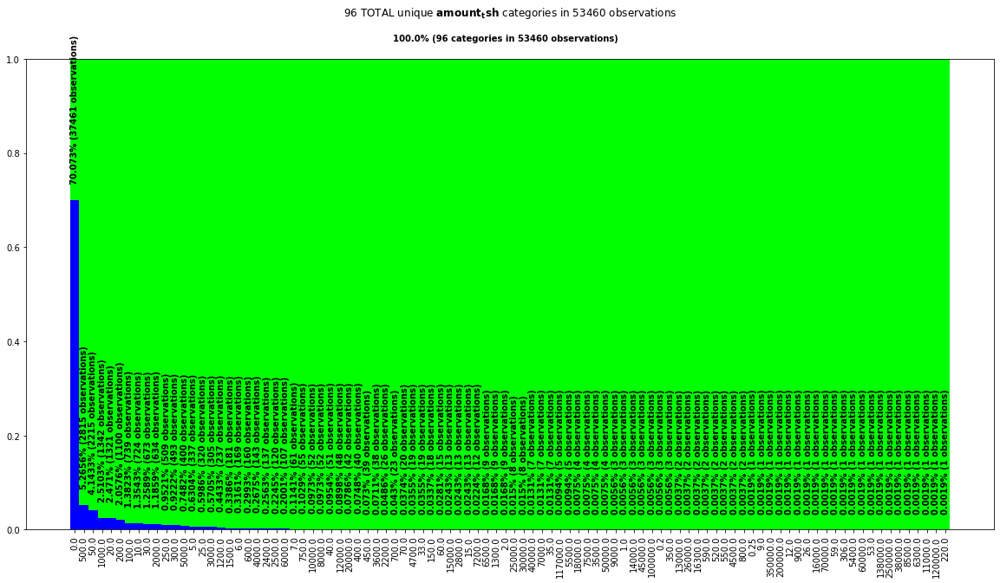

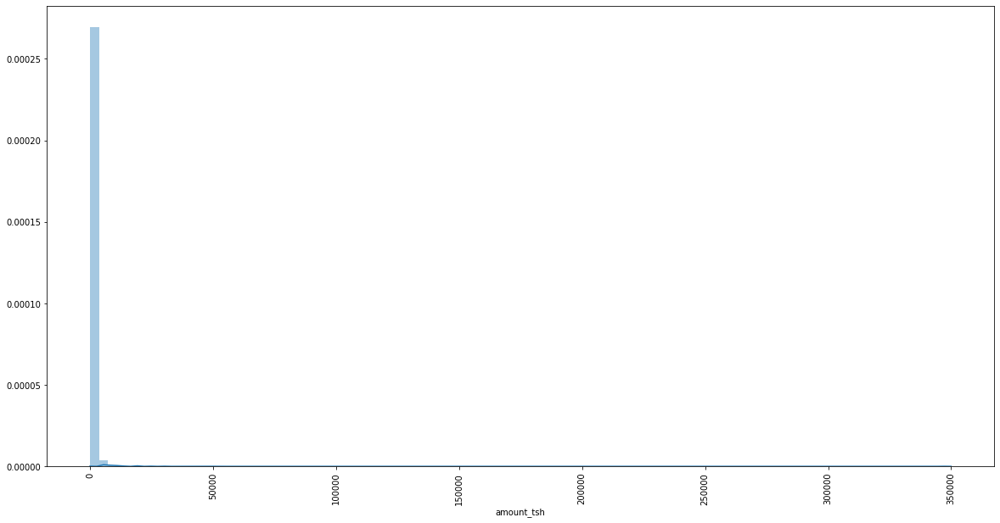

In [34]:
scjpnutils.analyze_distributions(X_train, 'X_train', 'amount_tsh');
# scjpnutils.analyze_distributions_grouped_by(data_train, feat='amount_tsh', group_by='status_group')

Now let's consider the possibility that <b>amount_tsh</b> is continuous and then let's look at its outliers.

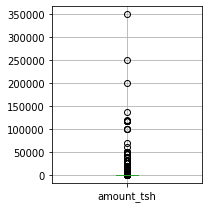

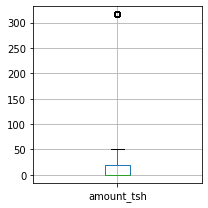

,feature,dtype,q1,q3,IQR_lower_bound,IQR_upper_bound,n_outliers,n_outliers_ratio,outliers_index
0,amount_tsh,float64,0.0,20.0,-30.0,50.0,10070,0.188365,"Int64Index([36420, 14207, 57940, 49053, 36909,..."


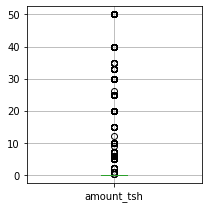

,feature,dtype,q1,q3,IQR_lower_bound,IQR_upper_bound,n_outliers,n_outliers_ratio,outliers_index
0,amount_tsh,float64,0.0,0.0,0.0,0.0,5929,0.110905,"Int64Index([44503, 29709, 67564, 12631, 6066,..."


In [35]:
scjpnutils.analyze_outliers_detailed(
    X_train, 
    'X_train', 
    'amount_tsh', 
    top_percentile=100, 
    outlier_ratio_reduction_threshold=.10
);
# scjpnutils.analyze_outliers_grouped_by(data_train, feat='amount_tsh', group_by='status_group', suppress_header=True)

Observations:

0. From the feature description, "Total static head (amount water available to waterpoint)", this seems like a fairly important feature and would probably be unwise to drop it.
1. Whether categorical (ordinal) or continuous, <b>amount_tsh</b> has many outlier values.
2. More than 70% of the observations (in train) have <b>amount_tsh</b> value 0, which would explain why traditional outlier-imputation semantics (mean/median/mode) won't do much to improve the situation

Since there are multiple ways to handle this situation, a study has been executed to find the optimal model produced by an finite array of well-defind strategies.

Methods considered were:

1. Leave the feature as is.
2. (Regular, NOT Leave-One-Out) Target encode the feature wherein resulting `nan` values ARE mapped to the global mean of the fit target (from the training set).
3. (Regular, NOT Leave-One-Out) Target encode the feature wherein resulting `nan` values left as is - i.e. NOT mapped to the global mean of the fit target (from the training set); note that this precludes the use of tree-based classifiers incapable of handling `nan` values - i.e. `DecisionTreeClassifier` and `RandomForesetClassifier` - thus, we only use `XGBClassifier` in this case.
4. (Leave-One-Out) Target encode the feature wherein resulting `nan` values ARE mapped to the global mean of the fit target (from the training set).
5. (Leave-One-Out) Target encode the feature wherein resulting `nan` values left as is - i.e. NOT mapped to the global mean of the fit target (from the training set); note that this precludes the use of tree-based classifiers incapable of handling `nan` values - i.e. `DecisionTreeClassifier` and `RandomForesetClassifier` - thus, we only use `XGBClassifier` in this case.
6. Replace 0-values with `nan`; note that this precludes the use of tree-based classifiers incapable of handling `nan` values - i.e. `DecisionTreeClassifier` and `RandomForesetClassifier` - thus, we only use `XGBClassifier` in this case.

The last technique proved to be the best method.

<p/><br/>
<h4>Post-Feature Analysis Handling (via configured <code>StrategyTransformer</code>): <i>amount_tsh</i></h4>

In [36]:
amount_tsh_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['amount_tsh'], 
    'amount_tsh', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{amount_tsh_strat_transformer.description}</font></i></h5>"))

X_train = amount_tsh_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['drop feature amount_tsh', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd72eb80ad0>] appended to pipeline
strategy transformation for feature amount_tsh COMPLETE


Now let's move on to feature kind <b>pump_age_at_observation_date</b>.

<p><br><br>

In [37]:
display_feature_kind('pump_age_at_observation_date')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,date_recorded,object,352,"[2002-10-14, 2004-03-01, 2004-03-06, 2004-04-0...",0.006584,99.34,0,0.0,None
1,construction_year,int64,55,"[0, 1960, 1961, 1962, 1963, 1964, 1965, 1966, ...",0.001029,99.90,0,0.0,None


Here, our goal is to engineer a new feature (as described) and there is really only one way to do it - i.e. *we do not use `variable_transformation_strategies` specified in the configuration*.

There is one important question to highlight beforehand: <b><i>if</i> it occurs, what does a <u>negative</u> pump age mean</b>?

#### Feature Analysis: *date_recorded*

It has no null/missing values.  

This feature clearly should be a `date` type but is a `string`.

We'll convert it to a `date` type accordingly.

In [38]:
X_train.date_recorded.min()

'2002-10-14'

In [39]:
X_train.date_recorded.max()

'2013-12-03'

In [40]:
ft_date_recorded_to_date = FunctionTransformer(lambda X: scjpnutils.convert_col_to_date_type(X, 'date_recorded'), validate=False)
pipeline_data_preprocessor.steps.append(['convert feature to datetime type: date_recorded', ft_date_recorded_to_date])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].fit_transform(X_train, y_train_encoded)

In [41]:
X_train.date_recorded.value_counts()

2011-03-15    515
2011-03-17    509
2013-02-03    489
2011-03-16    465
2011-03-14    451
             ... 
2011-09-19      1
2004-08-01      1
2011-09-14      1
2011-09-27      1
2011-09-12      1
Name: date_recorded, Length: 352, dtype: int64

Let's have a look at the distribution just to ensure there is nothing wonky about it.

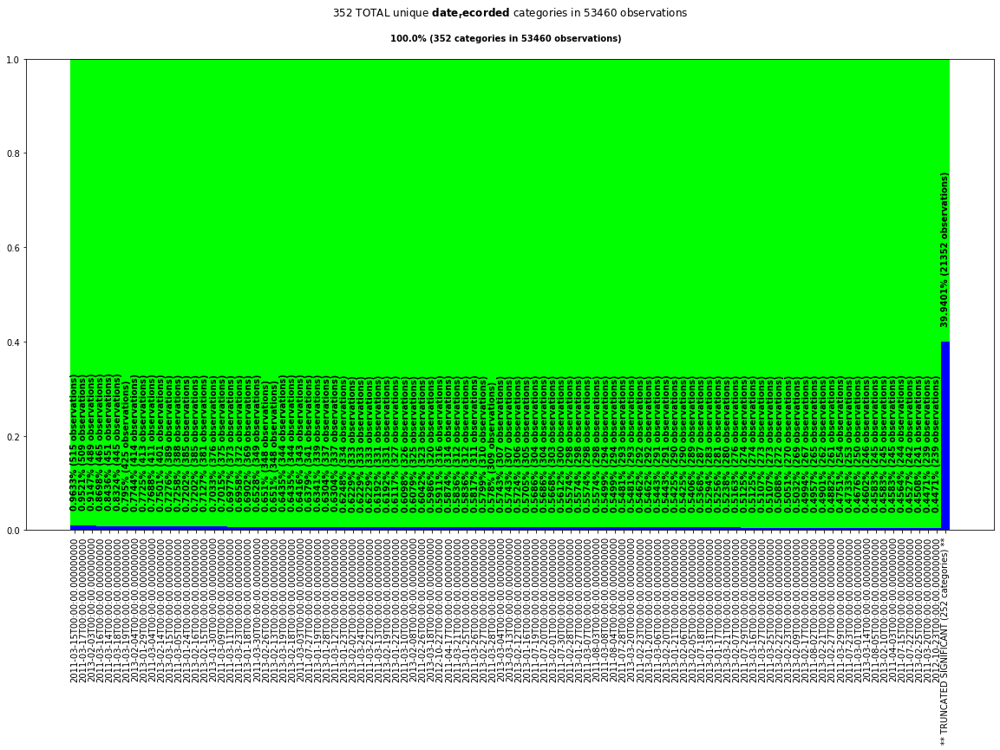

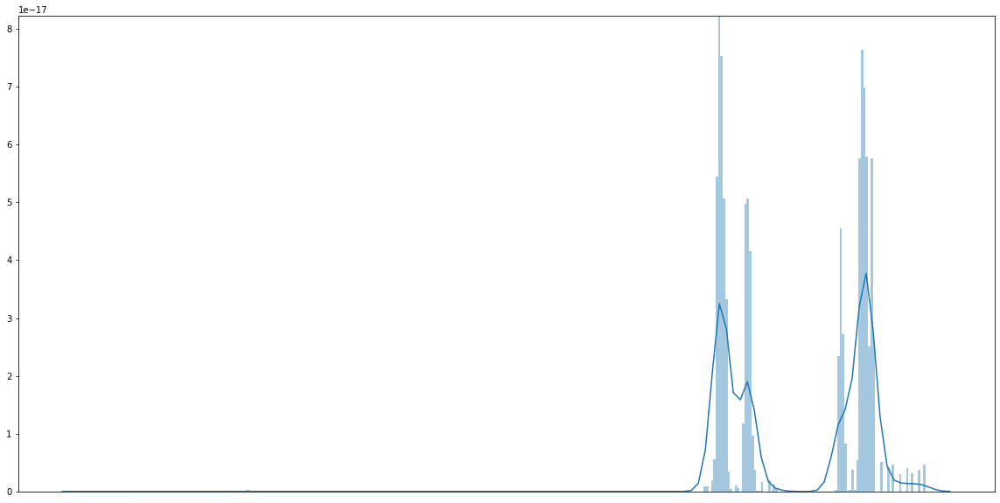

In [42]:
scjpnutils.analyze_distributions(
    X_train, 
    'X_train', 
    'date_recorded'
);

There are some older <b>date_recorded</b> values but, for the most part, everything looks good so we'll move on to <b>construction_year</b>.

#### Feature Analysis: *construction_year*

It has no null/missing values.  

This feature clearly should be a `date` type but is an `int`.

We'll convert it to a `date` type accordingly.

We notice there is a 0 <b>construction_year</b> value.  

This will cause problems for us so we need to replace it with a meaningful value that doesn't otherwise disturb the distribution.

Note that this MUST be done prior to conversion to `date` type.

<p><br>
Additionally, we need to address the "<b><i>if</i> it occurs, what does a <u>negative</u> pump age mean</b>?" question...

This circumstance occurs when <b>construction_year</b> > <b>date_recorded</b>.

Let's take a quick look at the value counts.

In [43]:
X_train.construction_year.value_counts()

0       18688
2010     2375
2008     2339
2009     2301
2000     1886
2007     1426
2006     1316
2003     1157
2011     1127
2004     1015
2002      983
2012      966
1978      927
1995      924
2005      897
1999      892
1998      856
1985      847
1990      845
1996      731
1980      728
1984      712
1982      660
1994      659
1972      641
1974      610
1997      580
1992      565
1993      548
2001      472
1988      471
1983      442
1986      392
1975      388
1976      373
1970      372
1991      289
1989      275
1987      268
1981      220
1977      186
1973      168
1979      167
2013      164
1971      127
1960       93
1967       83
1963       77
1968       64
1969       52
1964       36
1962       28
1965       18
1966       17
1961       17
Name: construction_year, dtype: int64

In order to find all observations where <b>construction_year</b> > <b>date_recorded</b>, we must convert <b>construction_year</b> to a `date` type to make it comparable to <b>date_recorded</b>.  

But this presents an odd situation since the ability to do so requires handling 0-valued <b>construction_year</b> observations FIRST!

So how do we choose an appropriate replacement semantic?  Let's take a look at some simple statistics.

In [44]:
X_train.construction_year.describe()

count    53460.000000
mean      1298.789338
std        952.211910
min          0.000000
25%          0.000000
50%       1985.000000
75%       2004.000000
max       2013.000000
Name: construction_year, dtype: float64

We see that replacing 0 with the mean value is a bad idea since this will map all of those 0-valued <b>construction_year</b> observations to an unrealistic year!  We might think that replacing with the median can work - and it can - but then, since our goal is to track pump age (at the time the observation was recorded), the computed pump age (distribution) will be thrown off.

So let's analyze the distribution of values WITHOUT 0.  We will compare this to the distribution after replacement.

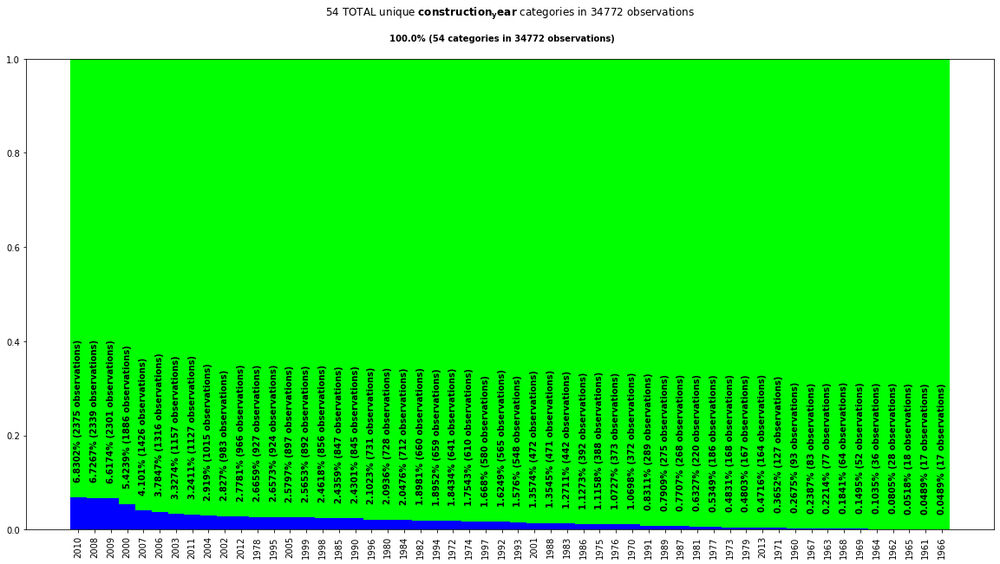

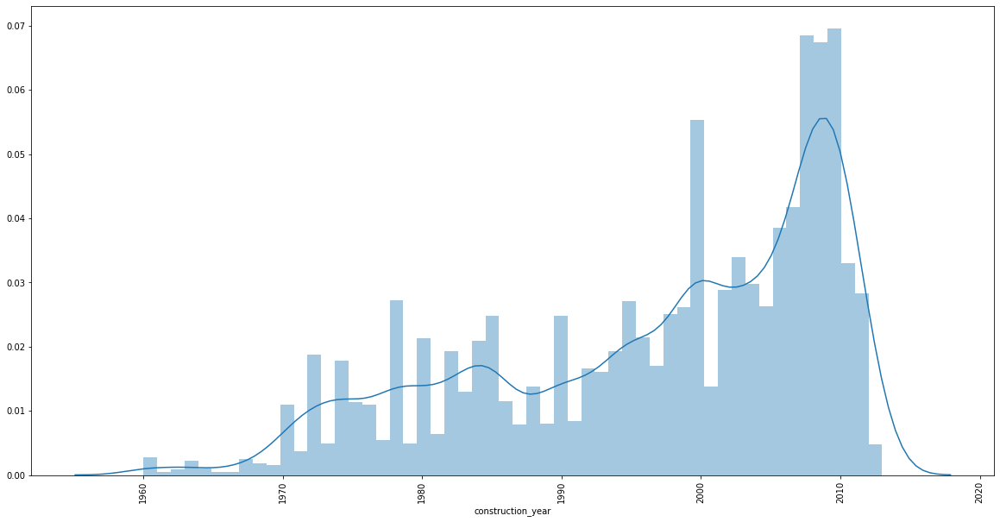

In [45]:
X_train__ct_yr_no_0 = X_train[X_train.construction_year != 0]
scjpnutils.analyze_distributions(
    X_train__ct_yr_no_0, 
    'X_train__ct_yr_no_0', 
    'construction_year'
);

In [46]:
X_train__ct_yr_no_0.construction_year.describe()

count    34772.000000
mean      1996.815771
std         12.478127
min       1960.000000
25%       1987.000000
50%       2000.000000
75%       2008.000000
max       2013.000000
Name: construction_year, dtype: float64

The mean <b>construction_year</b> is around 1997 and the median is 2000.  Replacing <b>construction_year</b> with either of these could work.  BUT, we now have to think about the goal of this sub-exercise: to track pump age at the time of the observation recording.  Recall that <b>construction_year</b> 0 essentially represents the unknown.  By replacing this value with ANY value whatsoever will create a synthetic and known pump age, derived from a <b>construction_year</b> that was previously unknown.  So how do we resolve this?

We might resolve this by replacing 0 <b>construction_year</b> with the OLDEST (minimum) <b>date_recorded</b>.

This will ensure that the new <b>pump_age_at_observation_date</b> is at best 0 (years) at and, at worst, $most\_recent(date\_recorded) - oldest(date\_recorded)$.

In [47]:
def replace_0_construction_year_with_min_date_recorded(df):
    df_copy = df.copy()
    replace_0_construction_year_rules = {
        'construction_year': [{
            'missing_values': 0, 
            'strategy': 'constant', 
            'fill_value': df_copy.date_recorded.min().year
        }]
    }
    svt_0_construction_year = SimpleValueTransformer(replace_0_construction_year_rules)
    df_copy = svt_0_construction_year.fit_transform(df_copy)
    return df_copy

ft_replace_0_construction_year_with_min_date_recorded = FunctionTransformer(lambda X: replace_0_construction_year_with_min_date_recorded(X), validate=False)
# DON'T add this step to the pipeline yet since we are not yet committed to do this - it is for analysis ONLY
# pipeline_data_preprocessor.steps.append(['replace 0 with minimum date_recorded: construction_year', ft_replace_0_construction_year_with_min_date_recorded]) # not yet

X_train__0_construction_year_replaced_with_min_date_recorded = ft_replace_0_construction_year_with_min_date_recorded.fit_transform(X_train)


Now we should be able to safely convert <b>construction_year</b> to `date` type. 

In [48]:
ft_construction_year_to_date = FunctionTransformer(lambda X: scjpnutils.convert_col_to_date_type(X, 'construction_year', format="%Y"), validate=False)
# DON'T add this step to the pipeline yet since this step is predicated on handling 0-valued construction_year replacement and we have not yet settled on a final semantic - this is used for analysis ONLY; HOWEVER, we will be using ft_construction_year_to_date again since we know construction_year must be converted to a datetime type after all said and done
# pipeline_data_preprocessor.steps.append(['convert feature to datetime type: construction_year', ft_construction_year_to_date]) # not yet

X_train__0_construction_year_replaced_with_min_date_recorded = ft_construction_year_to_date.fit_transform(X_train__0_construction_year_replaced_with_min_date_recorded)


Now let's find all observations where <b>construction_year</b> > <b>date_recorded</b>.

In [49]:
X_train__0_construction_year_replaced_with_min_date_recorded[X_train__0_construction_year_replaced_with_min_date_recorded['construction_year']>X_train__0_construction_year_replaced_with_min_date_recorded['date_recorded']][['construction_year', 'date_recorded']]

,construction_year,date_recorded
id,,
48759,2011-01-01,2004-06-01
5971,2007-01-01,2004-03-01
9195,2005-01-01,2004-03-01
1251,2008-01-01,2004-12-01
20198,2008-01-01,2004-05-01
55069,2006-01-01,2004-12-01
20534,2009-01-01,2004-03-01
15921,2009-01-01,2004-03-06


How can this be?  From above, we saw that the oldest <b>date_recorded</b> is 2002-10-14.  Recall the semantic for 0-valued <b>construction_year</b> was to replace with the oldest <b>date_recorded</b> (2002-10-14).  Since no <b>construction_year</b> above has value 2002-10-14, this was not the problem.  So the reason for the above must be something else.  Could it be that either <b>construction_year</b> or <b>date_recorded</b> values are errors, or is it still yet something else?

One plausible explanation could be that <u><b>construction_year</b> tracks when construction completed and <b>date_recorded</b> tracks when it began</u>.

If this is indeed the case, and it seems likely it is, then our replacement semantic above was INCORRECT!  Therefore, for 0-valued <b>construction_year</b>, it seems the best we can do is replace <b>construction_year</b> with the observation's <b>date_recorded</b>.  This will yield a 0-value for <b>pump_age_at_observation_date</b>, which is acceptable since this likely represents the case that construction had begun at the time the observation was recorded but was not yet finished.  A 0-value for <b>pump_age_at_observation_date</b> captures this information.

But, then, how do we handle observations, such as those above, in which construction had begun but was not yet completed at the time the observation was recorded (<b>date_recorded</b>) BUT the recorder later updates the record when construction completes?  To be clear, we see that the observations above indicate the following:

1. At the time the observation was recorded, construction had begun but was not yet finished.
2. Then, upon completion of construction, the recorder evidently updated the record with the date construction finally did complete.

So, with that in mind, if we ALLOW <b>construction_year</b> > <b>date_recorded</b> - then <b>pump_age_at_observation_date</b> < 0 also captures the above information (which probably can have some impact on the predictive model)!

Let's put this into play!

The first thing to do is to replace 0-valued <b>construction_year</b> with the observation's <b>date_recorded</b>.

In [50]:
# this is a very specialized function which has intimate knowledge of both construction_year and date_recorded
# it assumes date_recorded has already been converted to datetime
# it assumes construction_year is still and int - i.e. has not yet been converted to datetime
# for 0-valued construction_year, it will extract the year (as an int) from date_recorded to use as a replacement
def replace_0_construction_year_with_date_recorded(df, suppress_output=True):
    df_copy = df.copy()
    df_copy_0_construction_year = df_copy[df_copy.construction_year==0]
    if not suppress_output:
        display(HTML(f"<h3>BEFORE replacing 0-valued <i>construction_year</i> (with <i>date_recorded</i>):</h3>"))
        display(HTML(df_copy.loc[df_copy_0_construction_year.index][['date_recorded', 'construction_year']].to_html(notebook=True, justify='left', max_rows=25)))
    df_copy['dt_recorded_yr'] = df_copy.date_recorded.dt.year
    df_copy['construction_year'] = np.where(df_copy['construction_year']==0, df_copy['dt_recorded_yr'], df_copy['construction_year'])
    df_copy = df_copy.drop('dt_recorded_yr', axis=1)
    if not suppress_output:
        display(HTML(f"<h3>AFTER replacing 0-valued <i>construction_year</i> (with <i>date_recorded</i>):</h3>"))
        display(HTML(df_copy.loc[df_copy_0_construction_year.index][['date_recorded', 'construction_year']].to_html(notebook=True, justify='left', max_rows=25)))
    return df_copy, df_copy_0_construction_year.index

ft_replace_0_construction_year_with_date_recorded = FunctionTransformer(lambda X: replace_0_construction_year_with_date_recorded(X)[0], validate=False)

# test
_, at_index = replace_0_construction_year_with_date_recorded(X_train, suppress_output=False)

,date_recorded,construction_year
id,,
11841,2011-07-24,0
1186,2012-11-05,0
71895,2011-07-27,0
569,2011-08-07,0
66515,2013-01-23,0
27945,2011-07-20,0
53108,2011-07-19,0
31018,2013-02-08,0
35243,2011-04-08,0


,date_recorded,construction_year
id,,
11841,2011-07-24,2011
1186,2012-11-05,2012
71895,2011-07-27,2011
569,2011-08-07,2011
66515,2013-01-23,2013
27945,2011-07-20,2011
53108,2011-07-19,2011
31018,2013-02-08,2013
35243,2011-04-08,2011


The transformation looks good.  So let's apply it and commit it to the `Pipeline`.

In [51]:
pipeline_data_preprocessor.steps.append(['replace 0 with date_recorded: construction_year', ft_replace_0_construction_year_with_date_recorded])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].fit_transform(X_train, y_train)

Convert <b></b> to `date` type...

In [52]:
pipeline_data_preprocessor.steps.append(['convert feature to datetime type: construction_year', ft_construction_year_to_date])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].fit_transform(X_train, y_train)

In [53]:
# this function assumes that:
#    ft_replace_0_construction_year_with_date_recorded has already transformed construction_year
#    ft_construction_year_to_date has already transformed construction_year
def add_pump_age_feature(df):
    df_copy = df.copy()

    df__pump_age__debug = df_copy[['date_recorded', 'construction_year']].copy()

    # now simply compute date diff (in years)
    df__pump_age__debug['pump_age'] = df__pump_age__debug['date_recorded'].dt.year - df__pump_age__debug['construction_year'].dt.year
    df_copy['pump_age'] = df__pump_age__debug['pump_age']

    return df_copy

# test
X_train__with_pump_age = add_pump_age_feature(X_train)
X_train__with_pump_age[['date_recorded', 'construction_year', 'pump_age']]

,date_recorded,construction_year,pump_age
id,,,
56146,2013-03-06,2012-01-01,1
38945,2013-02-05,2009-01-01,4
11841,2011-07-24,2011-01-01,0
1186,2012-11-05,2012-01-01,0
36420,2011-03-26,1996-01-01,15
...,...,...,...
67998,2013-02-18,2005-01-01,8
47669,2013-01-22,2009-01-01,4
1071,2013-01-27,1979-01-01,34


We're almost ready to apply and commit this step.  The last thing we need to do is make sure that negative <b>pump_age</b> (for the case when construction was still under way at the time the observation was recorded and then later updated) is captured appropriately.

In [54]:
X_train__with_pump_age[X_train__with_pump_age['pump_age']<0][['date_recorded', 'construction_year', 'pump_age']]

,date_recorded,construction_year,pump_age
id,,,
48759,2004-06-01,2011-01-01,-7
5971,2004-03-01,2007-01-01,-3
9195,2004-03-01,2005-01-01,-1
1251,2004-12-01,2008-01-01,-4
20198,2004-05-01,2008-01-01,-4
55069,2004-12-01,2006-01-01,-2
20534,2004-03-01,2009-01-01,-5
15921,2004-03-06,2009-01-01,-5


Finally, let's have a look at the distribution of <b>pump_age</b>.

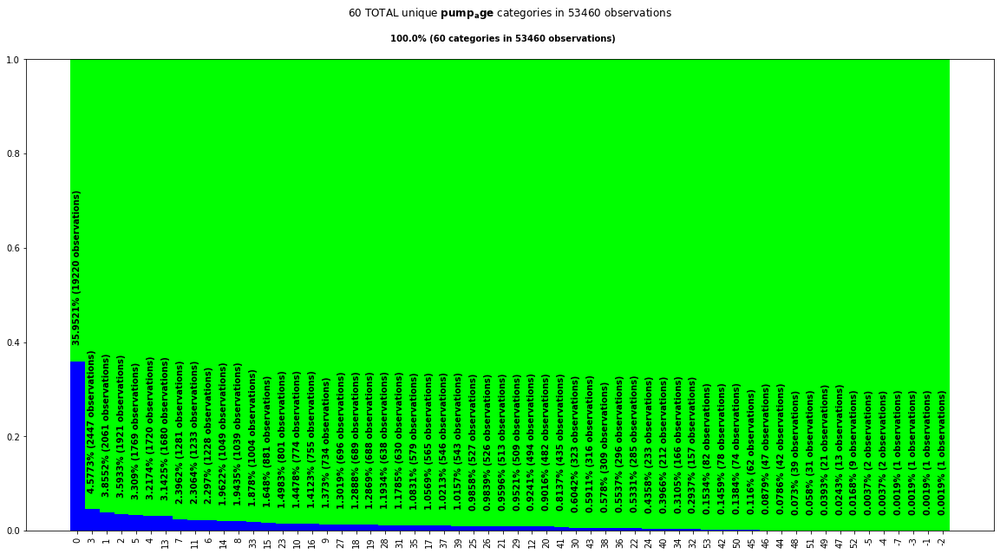

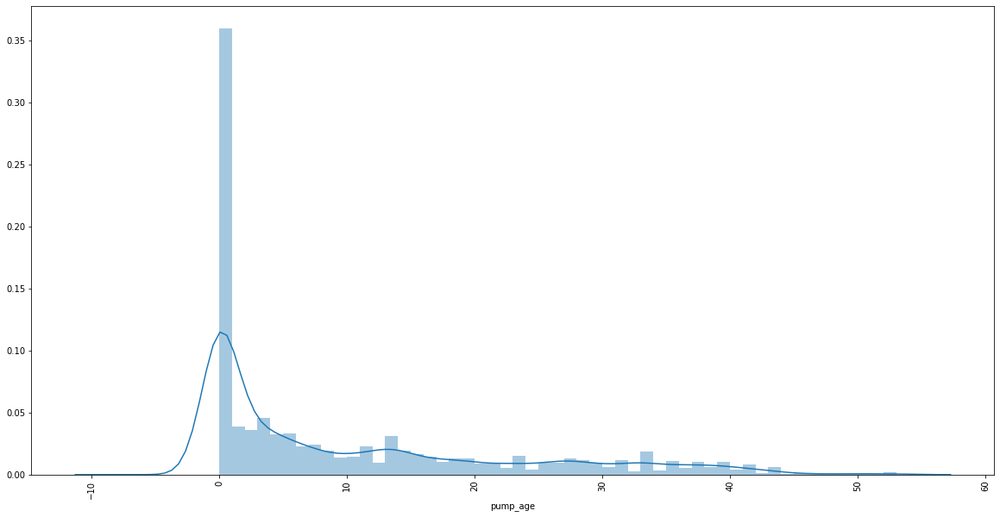

In [55]:
scjpnutils.analyze_distributions(
    X_train__with_pump_age, 
    'X_train__with_pump_age', 
    'pump_age'
);

This all looks great.

Let's now apply and commit this step to the `Pipeline`.

In [56]:
ft_add_pump_age_feature = FunctionTransformer(lambda X: add_pump_age_feature(X), validate=False)
pipeline_data_preprocessor.steps.append(['add feature: pump_age', ft_add_pump_age_feature])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].fit_transform(X_train, y_train)

Finally, since we extracted "more" information from <b>date_recorded</b> and <b>construction_year</b> than they both individually contained, we will drop them from consideration in the cleaned data set so that the final classification will not be overfit.

In [57]:
dct_date_recorded_and_construction_year = DropColumnsTransformer(['date_recorded', 'construction_year'])
pipeline_data_preprocessor.steps.append(['drop potential overfit columns: date_recorded and construction_year', dct_date_recorded_and_construction_year])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].fit_transform(X_train, y_train)

Now let's move on to feature kind <b>funder</b>.

<p><br><br>

In [58]:
display_feature_kind('funder')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,funder,object,1799,"[0, A/co Germany, Aar, Abas Ka, Abasia, Abc-ih...",0.033651,96.63,3269,0.061149,"Int64Index([ 569, 35243, 7826, 7576, 71341,..."


#### Feature Analysis: *funder*

There are a fair amount of null/missing values.

Being an object with a small percentage of unique values, this feature is likely categorical.

Let's have a look at its value counts that aren't null/missing.

In [59]:
X_train.funder.value_counts()

Government Of Tanzania            8167
Danida                            2784
Hesawa                            1998
Rwssp                             1247
World Bank                        1231
                                  ... 
Dom                                  1
African Realief Committe Of Ku       1
Tlc/sorri                            1
Fida                                 1
Chani                                1
Name: funder, Length: 1798, dtype: int64

But we need to handle those null/missing values in order to get a clearer picture.

So what do we replace null/missing values with??

Let's see if <b>funder</b> contains common "none" type words...

In [60]:
# let's make this easier by normalizing values to lower-case...
def impute_lcase(df, feat):
    #exclude nulls since this may not have been done yet
    df_nulls_excluded = df[df[feat].isnull()==False]

    df_feat_with_ucase_vals = df_nulls_excluded.loc[df_nulls_excluded[feat].str.contains('[A-Z]+',regex=True)==True]
    if len(df_feat_with_ucase_vals) > 0:
        impute_lcase_rules = {}
        impute_lcase_rules[feat] = lambda v: v.lower()
        lt_lcase_cat_predictors = LambdaTransformer(impute_lcase_rules)
        df_lcased = lt_lcase_cat_predictors.fit_transform(df_feat_with_ucase_vals)
        return pd.concat([df_lcased, df[~df.index.isin(df_lcased.index)]], axis=0, ignore_index=False)
    else:
        return df

ft_impute_lcase_funder = FunctionTransformer(lambda X: impute_lcase(X, 'funder'), validate=False)
X_train_funder_lcase = ft_impute_lcase_funder.fit_transform(X_train)

# finally, check to see if there is an appropriate existing value in X_labeled.funder to indicate null - e.g. 'none', 'unknown', 'not known', etc.
scjpnutils.index_of_values(X_train_funder_lcase, 'X_labeled', 'funder', ['none', 'unknown', 'not known'])

(array([  886,  3156,  4944,  5913,  6895,  9058, 11852, 12367, 16005,
        16208, 16432, 19917, 20406, 22652, 23169, 23287, 24323, 28104,
        31103, 33451, 33999, 36005, 38081, 38414, 39279, 40039, 40570,
        43909, 45756]),
 array(['not known', 'unknown', 'none'], dtype=object))

Well now... we have some work to do.  Not only do we have null/missing values to contend with, we also have multiple non-null representations of the same concept.

Actually, "unknown" (or "not known") is not really the same concept as "none", now is it?

Let's deal with null/missing values first.

Before we do that, we will apply the above step (imputing lower-case) and commit it to the `Pipeline`.

In [61]:
pipeline_data_preprocessor.steps.append(['impute lower case: funder', ft_impute_lcase_funder])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].fit_transform(X_train, y_train)

Now that that's done, our job of imputing the appropriate value ("none") on null/missing <b>funder</b> values will be much easier.

Note that we will adopt this semantic in general for ALL null/missing `string`-type variable values - i.e. <b><u>ALL</u> null/missing `string`-type variable values will be replaced with "none"</b>.

Creating the boiler-plate for this step is straight-forward (we use `SimpleValueTransformer`).  Let's do so now, apply it, and commit it to the `Pipeline`.

In [62]:
missing_string_value_replacement = "none" # TO DO: add this to the config!

replace_null_rules = {'funder': [{'missing_values': np.nan, 'strategy': 'constant', 'fill_value': missing_string_value_replacement}]}
svt_null_funder = SimpleValueTransformer(replace_null_rules)
pipeline_data_preprocessor.steps.append(['impute \'none\' for missing values: funder', svt_null_funder])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].fit_transform(X_train, y_train)

Now, since we noticed there are multiple values that represent an unknown <b>funder</b> - values are "unknown" and "not known" - let's replace one with the other.

Replacing "not known" with "unknown" seems like the logical thing to do - one word is better than two for our purpose.

In [63]:
replace_same_concept_words = {'funder': [{'missing_values': "not known", 'strategy': 'constant', 'fill_value': "unknown"}]}
svt_not_known_funder = SimpleValueTransformer(replace_same_concept_words)
pipeline_data_preprocessor.steps.append(['replace same concept words: funder', svt_not_known_funder])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].fit_transform(X_train, y_train)

With null/missing values replaced with "none" and "not known" values replaced with "unknown", we are in a position to get an accurate view of the distribution of "unique" values.  

Later we will see that there are still many different "single-entity" representations of <b>funder</b> (as well as other categorical variable categories) that can only be addressed by more advanced techniques - `TF-IDF` with `KMeans` Clustering natural language analysis and processing.  It's not a straightforward task to find "duplicates" without these techniques.  Therefore, we will not truly be observing "unique" values in the following.

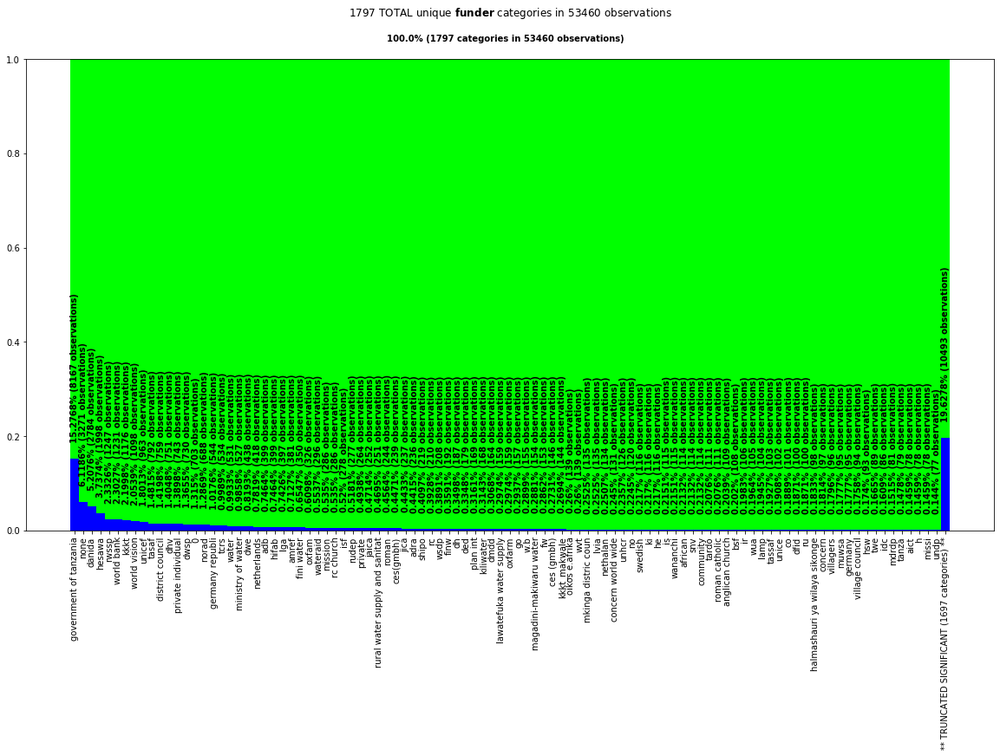

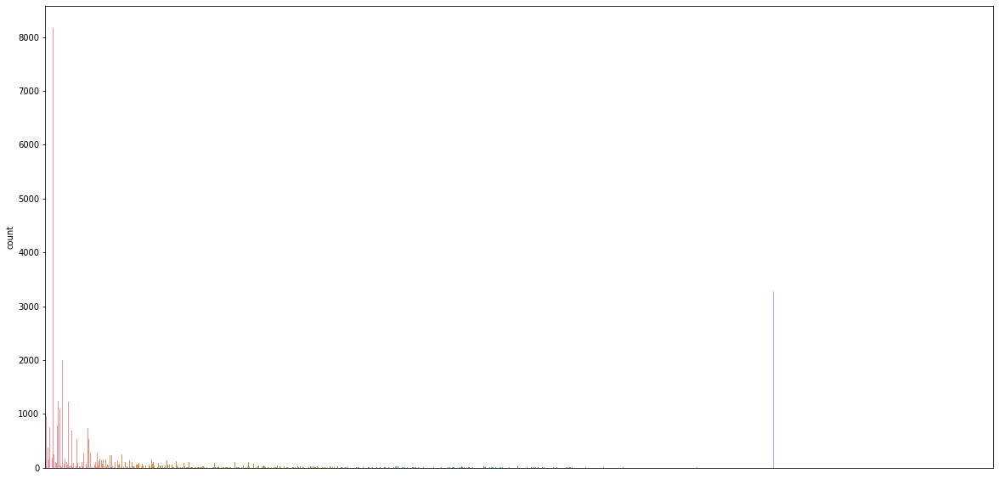

In [64]:
scjpnutils.analyze_distributions(
    X_train, 
    'X_train', 
    'funder'
);

Note that this categorical variable supposedly has 1694 "unique" categories!  That's quite a lot!  But are they really unique?

In [65]:
scjpnutils.analyze_non_alphanumeric_strings(X_train[['funder']], 'X_train <i>funder</i>');

,feature,n_unique,n_non_alphanumeric_str,non_alphanumeric_str_index
0,funder,1797,20053,"Int64Index([ 1186, 57940, 44503, 66515, 44971,..."


Questions:

1. Is there really a funder named "action in a"?  Seems like a typo to me.
2. How about "adp/w"?
3. And look at all of those so-called "unique" <b>funder</b>s that start with the word "african" - in particular, are "african development bank" and "african development foundation" really DIFFERENT/unique entities?  It's hard to say.  Another example in this subset is "african realief committe of ku" and "african relie" - to me, this looks like a data entry error wherein the recorder pressed ENTER on his/her keyboard too soon; regardless, these two values appear as unique entities... not good in any case.
4. Perhaps a more blatant example is: "arab community" vs. "arabs community"; once again, these clearly reference the same real-world entity but are represented in the data as two different, "unique" <b>funder</b> entities.

You see the problem?  If we have seen this much "duplication" of single entities with different representations in only the first handful of examples, then this problem must be pervasive throughout this categorical variable... indeed, throughout ALL categorical variables (with high cardinality).

Thus, an <i>unsupervised learning</i> algorithm involving `TF-IDF` combined with `KMeans Clustering` has been developed to address this natural language processing problem.  I will not duplicate the details of that research herein - if you are interested in the details, they can be found in the separate <i>High Cardinality Text-based Categorical Variable Classification</i> Jupyter notebook ([CategoricalClassification-Algo.ipynb](CategoricalClassification-Algo.ipynb)) - but I will now apply the results, encapsulated in the `tfidf_kmeans_classify_feature` function, used below.

Note that this function is applied sparingly and only to those categorical variables with initially high cardinality.  

For example, <b>funder</b> has 1896 so-called "unique" categories - thus, its cardinality is very high.  Recall that the main point in this approach is to avoid One-Hot Encoding since Gradient-Boosted Tree Classifiers do not handle categorical variables with high cardinality <i>that have been One-Hot Encoded</i> very well.  ([One-Hot Encoding is making your Tree-Based Ensembles worse, here’s why?](https://towardsdatascience.com/one-hot-encoding-is-making-your-tree-based-ensembles-worse-heres-why-d64b282b5769)).  Not only will they suffer in accuracy relative to, for example, Label Encoding, but processing will take a VERY LOOONG TIME since a new column is added for each unique category (beyond the first, of course)!  In this example (<b>funder</b>), 1894 columms columns would be added via One-Hot Encoding if we did not do additional text processing (aside from what has been done already).  So, let's assume <b>funder</b> is the ONLY categorical variable and there are, let's say 10 continuous variables.  That's a matrix with $10 \times 54988 = 549880$ cells.  With just this one single categorical variable One-Hot Encoded, the size of the matrix increases to $549880 + (1894 \times 54988) = 549880 + 104147272 = 104697152$ cells!  Without going into too much detail, if we consider the memory footprint (not just in terms of cell-count), we jump from a few megabytes to literally Gigabytes of RAM required to hold this additional One-Hot Encoded data in memory.  If we add more high cardinality categorical variables to the mix, it gets UGLY really fast.  GridSearch becomes intractible as it can take literally days, if not weeks to complete given a paremeter grid beyond the most basic since building a SINGLE gradient-boosted-tree model can take hours.

Anyway, let's get back to it.  

Final note, here: since using the `tfidf_kmeans_classify_feature` function is basically a task involving building submodels - we actually build a `KMeans` model - there are hyper-parameters involved.  There are many hyper-parameters one can tune with `KMeans` but this has been abstracted away with the exception of the `n_clusters` hyper-parameter.  This is exposed only indirectly.  Instead, one *may* manipulate the mean cluster-size which should be related to the measure of disorder (entropy) after `TF-IDF` vectorization.  In fact, the default behavior is to do exactly that.  The idea goes like this:

1. `TF-IDF` vectorize the corpus of unique values.
2. Measure the entropy of the probability distribution `TF-IDF` vectorization creates - entropy represents "how many questions we must ask to get the right answer (given a probability distribution)" (see https://www.youtube.com/watch?v=2s3aJfRr9gE for a friendly explanation).
3. This effectively gives us the <u>mean</u> size a cluster `KMeans` creates should be.
4. So `KMeans` `n_clusters`, in this case, is defined as $n\_clusters = math.ceil(\frac{len(corpus)}{mean\_cluster\_size = entropy})$.

In [66]:
# ft_tfidf_kmeans_classify_funder = FunctionTransformer(lambda X: scjpnsubmodels.tfidf_kmeans_classify_feature(
#         X, 
#         '', 
#         'funder', 
#         verbose=0
#     )[0], 
#     validate=False
# )
# X_labeled_clean = ft_tfidf_kmeans_classify_funder.fit_transform(X_labeled_clean)

# # add this step to the pipeline
# pipeline_data_preprocessor.steps.append(['tfidf-kmeans-classify: funder', ft_tfidf_kmeans_classify_funder])

In [67]:
funder_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['funder'], 
    'funder', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{funder_strat_transformer.description}</font></i></h5>"))

X_train = funder_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['(prefit) target-encoder (LOO==False, post_encode_null_to_global_mean==True) transform: funder', FunctionTransformer(func=<function C__target_encode__StrategyTransformer.get_transformer.<locals>.<lambda> at 0x7fd7318885f0>)] appended to pipeline
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM INFO **: unique categories of 'funder' in X match those that were previously fit
added new feature: funder_target_encoded
['drop after target encoding: funder', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd730cd87d0>] appended to pipeline
dropped feature funder after target encoding
strategy transformation for feature funder COMPLETE


Let's move on to feature kind <b>gps_height</b>.

<p><br><br>

In [68]:
display_feature_kind('gps_height')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,gps_height,int64,2415,"[-90, -63, -59, -57, -55, -54, -53, -52, -51, ...",0.045174,95.48,0,0.0,None


#### Feature Analysis: *gps_height*

It has no null/missing values.

<b>gps_height</b> is very likely categorical (ordinal), even though it is numeric.

Let's have a look at its value counts.

In [69]:
X_train.gps_height.value_counts()

 0       18452
-15         54
-16         51
-20         50
 1290       48
         ...  
 2029        1
 2560        1
 2391        1
 2333        1
 2233        1
Name: gps_height, Length: 2415, dtype: int64

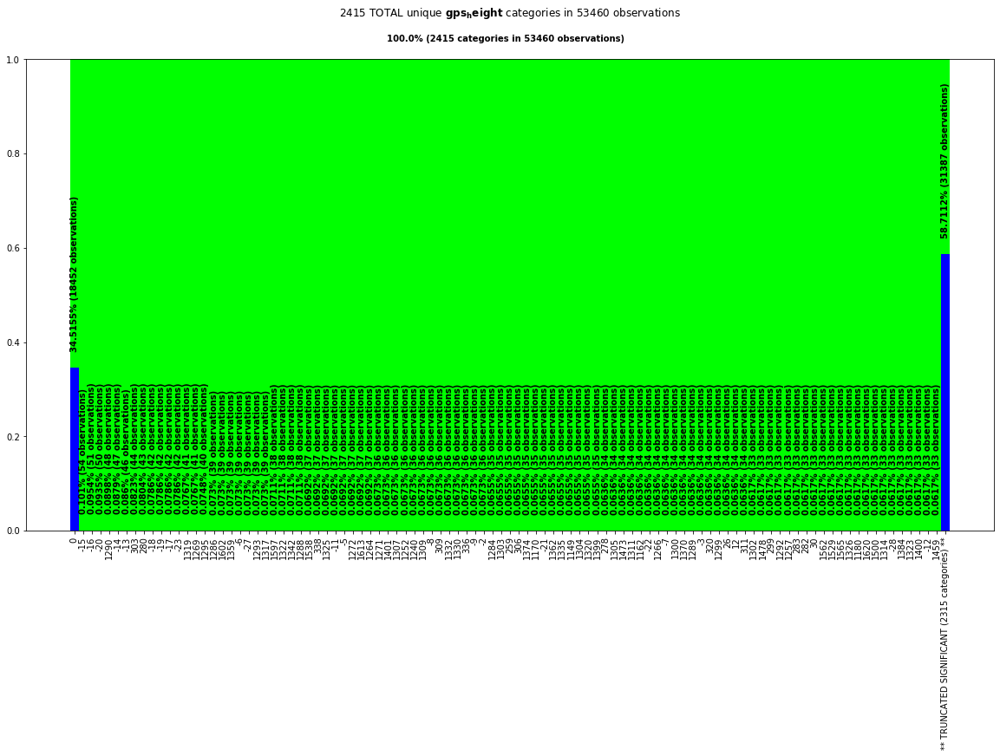

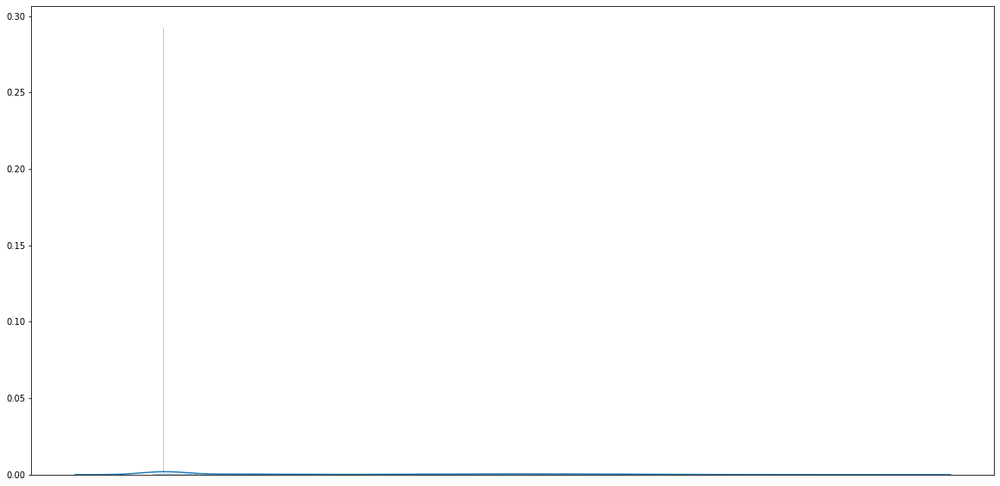

In [70]:
scjpnutils.analyze_distributions(
    X_train, 
    'X_train', 
    'gps_height'
);

Now let's consider the possibility that <b>gps_height</b> is instead continuous and then let's look at its outliers if this is so.

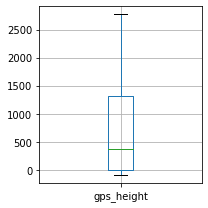

In [71]:
scjpnutils.analyze_outliers_detailed(
    X_train, 
    'X_train', 
    'gps_height', 
    top_percentile=34, 
    outlier_ratio_reduction_threshold=.10
);

There is not much going on here.  Whether we treat <b>gps_height</b> as a categorical (ordinal) or continuous, the result is the same since, continuously speaking, it has no outliers.

So we will simply leave it as is since it requires no transformations whatsoever.  NICE!

Let's move on to feature kind <b>installer</b>.

<p><br><br>

In [72]:
display_feature_kind('installer')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,installer,object,2035,"[-, 0, A.D.B, AAR, ABASIA, ABD, ABDALA, ABDUL,...",0.038066,96.19,3287,0.061485,"Int64Index([ 1941, 11904, 33428, 52680, 36682,..."


#### Feature Analysis: *installer*

The first thing we notice is that there appears to be quite a bit of overlap in values between <b>funder</b> and <b>installer</b>.  That is not to say that data is duplicated since we haven't seen whether or not values are similar for a given single observation.  But let's finish our initial commentary based on high-level value analysis.

There are a fair amount (3655) of null/missing values.

Being an object with a small percentage of unique values, this feature is likely categorical.

Let's have a look at its value counts that aren't null/missing.

In [73]:
X_train.installer.value_counts()

DWE                         15636
Government                   1645
RWE                          1084
Commu                         961
DANIDA                        944
                            ...  
Ubalozi wa Marekani /DWE        1
Seram                           1
Barry A. Murphy                 1
TCRS /DWE                       1
NYAHALE                         1
Name: installer, Length: 2034, dtype: int64

With <b>installer</b>, we seem to suffer from more or less the same kinds of feature deficits as we did with <b>funder</b>.  So we take a similar approach.

First we need to handle those null/missing values.

Like we did with <b>funder</b>, let's see if <b>installer</b> contains common "none" type words...

In [74]:
ft_impute_lcase_installer = FunctionTransformer(lambda X: impute_lcase(X, 'installer'), validate=False)
pipeline_data_preprocessor.steps.append(['impute lower case: installer', ft_impute_lcase_installer])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

# finally, check to see if there is an appropriate existing value in X_labeled.funder to indicate null - e.g. 'none', 'unknown', 'not known', etc.
scjpnutils.index_of_values(X_train, 'X_train', 'installer', ['none', 'unknown', 'not known'])

(array([ 2179,  3130,  5870,  8980, 11747, 19735, 20217, 22955, 23073,
        33173, 33717, 35708, 37770, 38957, 39704, 40231, 49135, 49177,
        49211, 49235, 49254, 49260, 49263, 49292, 49333, 49346, 49358,
        49365, 49366, 49367, 49375, 49412, 49434, 49471, 49493, 49508,
        49514]),
 array(['not known', 'unknown'], dtype=object))

Unlike <b>funder</b>, <b>installer</b> does NOT have a "none" category.

But exactly like <b>funder</b>, for <b>installer</b> there are also multiple values that represent an unknown <b>installer</b> - values are "unknown" and "not known" - let's replace one with the other.

And exactly like <b>funder</b>, for <b>installer</b>, we will replace "not known" with "unknown".

But, again, we need to handle null/missing values first.  Even though <b>installer</b> doesn't have an existing "none" category, we will introduce it and use it as the value replacement for null/missing values.

In [75]:
replace_null_rules = {'installer': [{'missing_values': np.nan, 'strategy': 'constant', 'fill_value': missing_string_value_replacement}]}
svt_null_installer = SimpleValueTransformer(replace_null_rules)
pipeline_data_preprocessor.steps.append(['impute \'none\' for missing values: installer', svt_null_installer])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

And now "unknown" and "not known" values...

In [76]:
replace_same_concept_words = {'installer': [{'missing_values': "not known", 'strategy': 'constant', 'fill_value': "unknown"}]}
svt_not_known_installer = SimpleValueTransformer(replace_same_concept_words)
pipeline_data_preprocessor.steps.append(['replace same concept words: installer', svt_not_known_installer])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

Now let's get an accurate view of the distribution of "unique" values.  

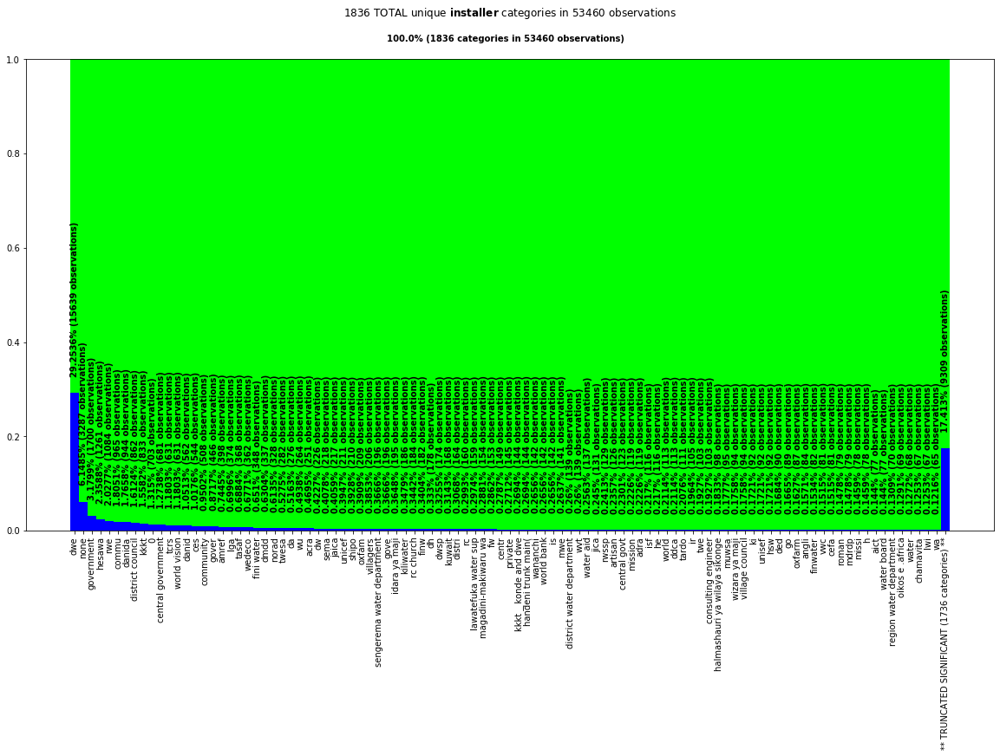

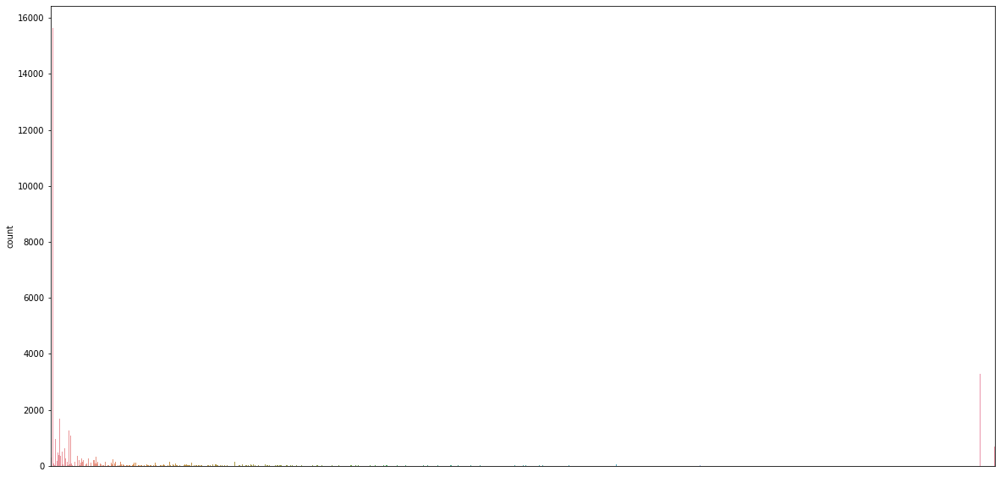

In [77]:
scjpnutils.analyze_distributions(
    X_train, 
    'X_train', 
    'installer'
);

Again, similar to <b>funder</b>, <b>installer<b/> supposedly has 1935 "unique" categories!  Again, it's quite a lot.  Certainly too many to One-Hot Encode.

We will again employ the `tfidf_kmeans_classify_feature` function to classify <b>installer</b>.

But before we do so, let's see how bad duplication is so we are sure it is indeed needed.

In [78]:
scjpnutils.analyze_non_alphanumeric_strings(X_train[['installer']], 'X_train <i>installer</i>');

,feature,n_unique,n_non_alphanumeric_str,non_alphanumeric_str_index
0,installer,1836,8592,"Int64Index([11841, 1186, 57940, 66515, 69129,..."


Wow!  The "duplication" situation seems to be just as bad for <b>installer</b> as it was for <b>funder</b>!

It looks like we do need `tfidf_kmeans_classify_feature`.

In [79]:
# ft_tfidf_kmeans_classify_installer = FunctionTransformer(lambda X: scjpnsubmodels.tfidf_kmeans_classify_feature(
#         X, 
#         '', 
#         'installer', 
#         verbose=0
#     )[0], 
#     validate=False
# )
# X_labeled_clean = ft_tfidf_kmeans_classify_installer.fit_transform(X_labeled_clean)

# # add this step to the pipeline
# pipeline_data_preprocessor.steps.append(['tfidf-kmeans-classify: installer', ft_tfidf_kmeans_classify_installer])

In [80]:
installer_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['installer'], 
    'installer', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{installer_strat_transformer.description}</font></i></h5>"))

X_train = installer_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['(prefit) target-encoder (LOO==False, post_encode_null_to_global_mean==True) transform: installer', FunctionTransformer(func=<function C__target_encode__StrategyTransformer.get_transformer.<locals>.<lambda> at 0x7fd73189a5f0>)] appended to pipeline
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM INFO **: unique categories of 'installer' in X match those that were previously fit
added new feature: installer_target_encoded
['drop after target encoding: installer', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd71d7f1d90>] appended to pipeline
dropped feature installer after target encoding
strategy transformation for feature installer COMPLETE


Let's move on to feature kind <b>gps_coordinates</b>.

<p><br><br>

In [81]:
display_feature_kind('gps_coordinates')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,latitude,float64,51755,"[-11.64944018, -11.64837759, -11.58629656, -11...",0.968107,3.19,0,0.0,None
1,longitude,float64,51753,"[0.0, 29.6071219, 29.60720109, 29.61096482, 29...",0.968070,3.19,0,0.0,None


Since these really form ordered pairs, it doesn't make much sense to examine them separately.

Notice that there is a zero value in <b>longitude</b>.

In [82]:
X_train_with_0_lon = X_train[X_train['longitude']==0][['latitude', 'longitude']]
X_train_with_0_lon

,latitude,longitude
id,,
52060,-2.000000e-08,0.0
38213,-2.000000e-08,0.0
66434,-2.000000e-08,0.0
69593,-2.000000e-08,0.0
36330,-2.000000e-08,0.0
...,...,...
58315,-2.000000e-08,0.0
20087,-2.000000e-08,0.0
25715,-2.000000e-08,0.0


Very interesting!  That definitely looks like a mistake.

In [83]:
X_train_with_0_lon.latitude.unique()

array([-2.e-08])

In [84]:
X_train_with_0_lon.latitude.min()

-2e-08

In [85]:
X_train_with_0_lon.latitude.max() # but does this value occur with any longitude != 0.0?

-2e-08

To me this looks like some sort of floating point/rounding error occurred.

Let's just see if this value for <b>latitude</b> occurs with any <b>longitude</b> other than 0.0.

In [86]:
X_train_with_weird_lat = X_train[(X_train['latitude']==-2.e-08) & (X_train['longitude']!=0.0)][['latitude', 'longitude']]
X_train_with_weird_lat

,latitude,longitude
id,,


It is, therefore, clear that <b>latitude</b> value -2e-08 should be replaced by 0.0.

In [87]:
X_train.longitude.min()

0.0

In [88]:
X_train.longitude.max()

40.34519307

So this is an easy fix...

In [89]:
replace_weird_latitude = {'latitude': [{'missing_values': -2.e-08, 'strategy': 'constant', 'fill_value': 0.0}]}
svt_weird_latitude = SimpleValueTransformer(replace_weird_latitude)
pipeline_data_preprocessor.steps.append(['replace weird values: latitude', svt_weird_latitude])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

In [90]:
X_train_with_0_lon = X_train[X_train['longitude']==0][['latitude', 'longitude']]
X_train_with_0_lon

,latitude,longitude
id,,
52060,0.0,0.0
38213,0.0,0.0
66434,0.0,0.0
69593,0.0,0.0
36330,0.0,0.0
...,...,...
58315,0.0,0.0
20087,0.0,0.0
25715,0.0,0.0


In [91]:
X_train_with_0_lon.latitude.unique()

array([0.])

In [92]:
X_train_with_0_lat = X_train[X_train['latitude']==0][['latitude', 'longitude']]
X_train_with_0_lat

,latitude,longitude
id,,
52060,0.0,0.0
38213,0.0,0.0
66434,0.0,0.0
69593,0.0,0.0
36330,0.0,0.0
...,...,...
58315,0.0,0.0
20087,0.0,0.0
25715,0.0,0.0


In [93]:
X_train_with_0_lat.longitude.unique()

array([0.])

In [94]:
X_train.latitude.min()

-11.64944018

In [95]:
X_train.latitude.max()

0.0

In [96]:
X_train.longitude.min()

0.0

In [97]:
X_train.longitude.max()

40.34519307

FIXED!!

Let's move on to feature kind <b>wpt_name</b>.

<p><br><br>

In [98]:
display_feature_kind('wpt_name')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,wpt_name,object,34085,"[24, A Kulwa, A Saidi, Abass, Abbas, Abdala Ha...",0.637579,36.24,0,0.0,None


#### Feature Analysis: *wpt_name*

There is almost no point analyzing this feature since it is clearly just another kind of identifier.

But let's give it its due diligence.

In [99]:
# takes too long! comment out during development...
# scjpnutils.analyze_distributions(
#     X_train, 
#     'X_train', 
#     'wpt_name'
# );

Again, we'll employ `analyze_non_alphanumeric_strings` to get a feel for "duplication" status.  If we see little duplication or the values appear to truly be unique names, then we should be able to write this feature off as a quasi-identifier.

In [100]:
scjpnutils.analyze_non_alphanumeric_strings(X_train[['wpt_name']], 'X_train <i>wpt_name</i>');

,feature,n_unique,n_non_alphanumeric_str,non_alphanumeric_str_index
0,wpt_name,34085,29687,"Int64Index([56146, 38945, 1186, 14207, 51349,..."


From the samples above, it seems pretty clear that this feature is indeed a quasi-indentifier.  We will drop it as a non-contributing feature.

In [101]:
dct_non_contrib__wpt_name = DropColumnsTransformer(['wpt_name'])
pipeline_data_preprocessor.steps.append(['drop non-contributing feature: wpt_name', dct_non_contrib__wpt_name])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

Let's move on to feature kind <b>num_private</b>.

<p><br><br>

In [102]:
display_feature_kind('num_private')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,num_private,int64,61,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14,...",0.001141,99.89,0,0.0,None


#### Feature Analysis: *num_private*

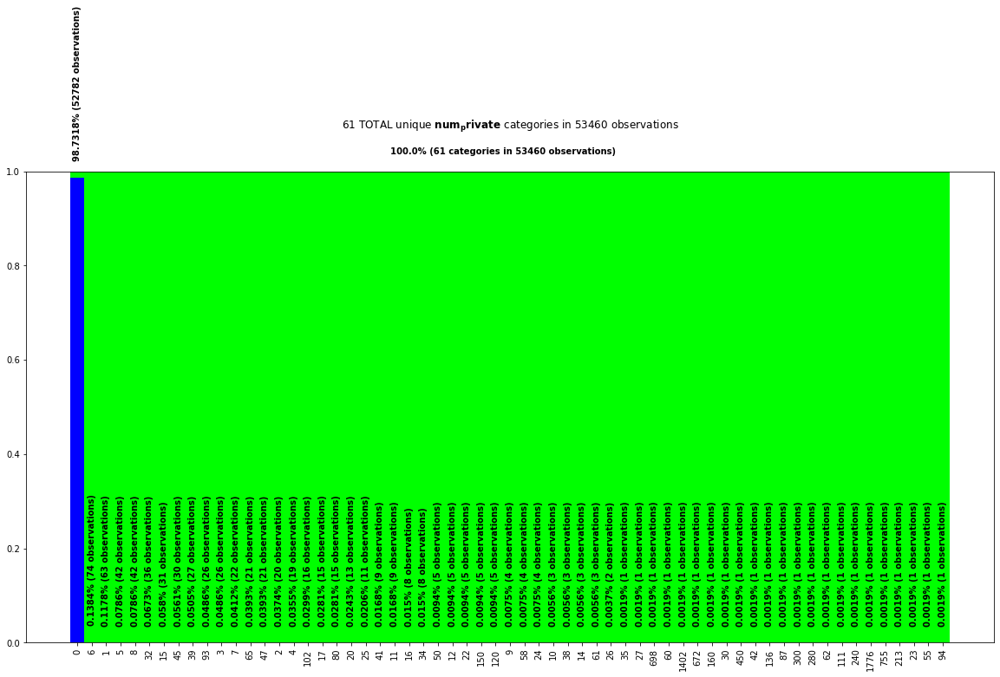

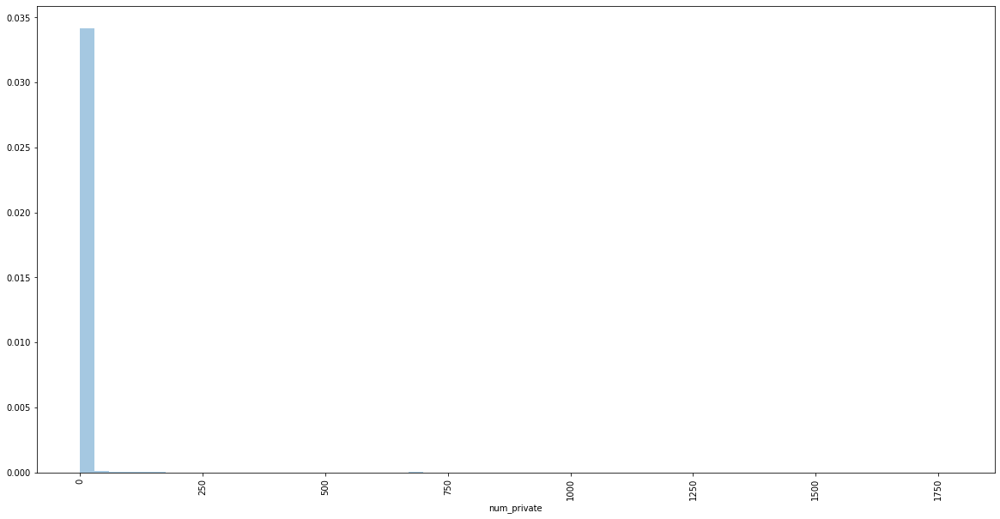

In [103]:
scjpnutils.analyze_distributions(
    X_train, 
    'X_train', 
    'num_private'
);

The above analysis indicates that 1 single value (0) constitutes more than 98% of the population of labeled observations!  We will <u>drop the <b>num_private</b> feature</u>.

In [104]:
dct_non_contrib__num_private = DropColumnsTransformer(['num_private'])
pipeline_data_preprocessor.steps.append(['drop non-contributing feature: num_private', dct_non_contrib__num_private])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

Let's move on to feature kind <b>basin</b>.

<p><br><br>

In [105]:
display_feature_kind('basin')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,basin,object,9,"[Internal, Lake Nyasa, Lake Rukwa, Lake Tangan...",0.000168,99.98,0,0.0,None


#### Feature Analysis: *basin*

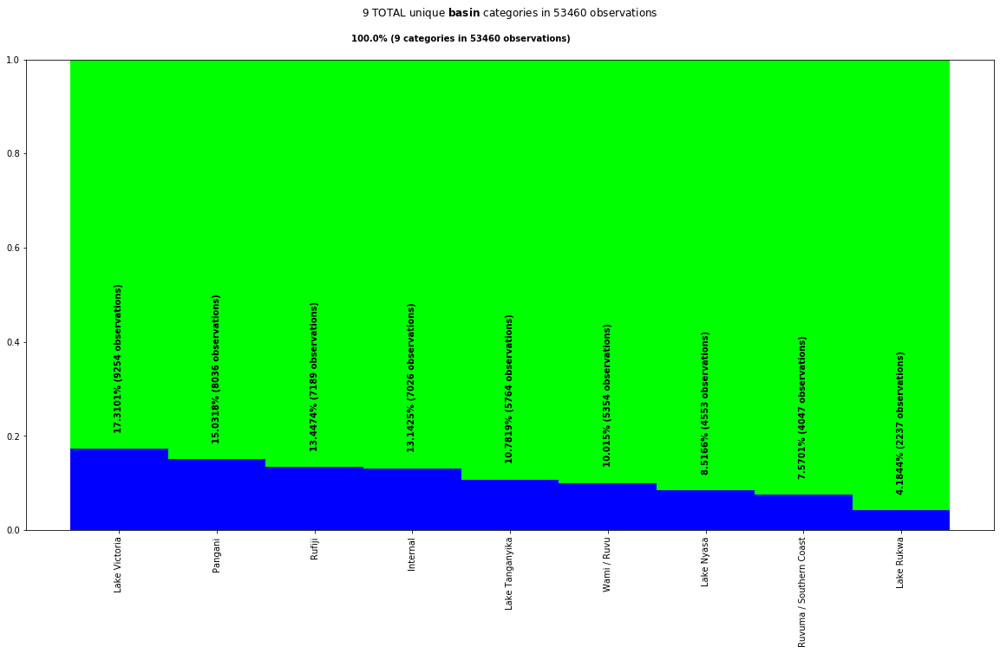

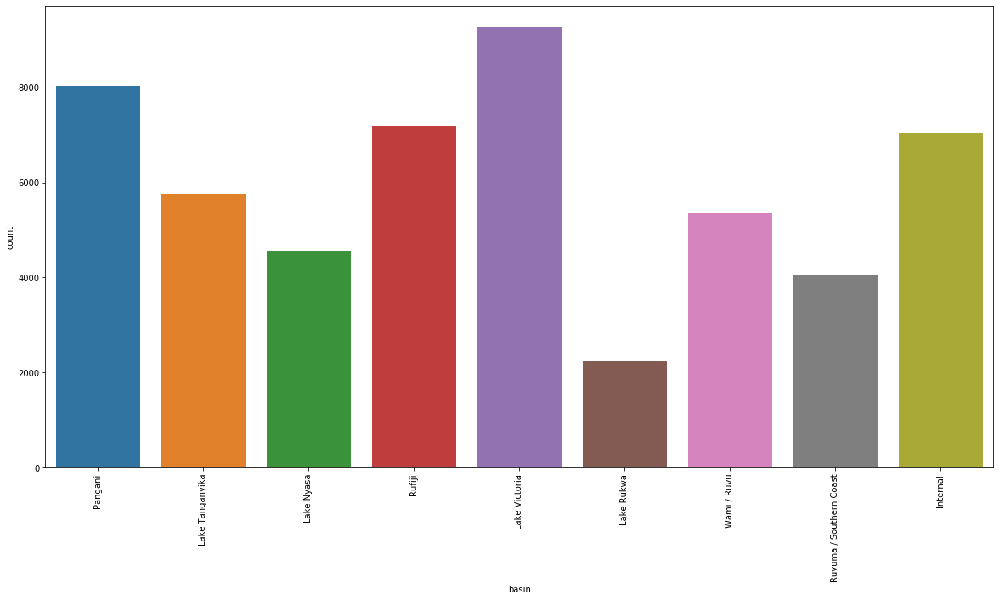

In [106]:
scjpnutils.analyze_distributions(
    X_train, 
    'X_train', 
    'basin'
);

There is nothing really out of the ordinary here.

In [107]:
ft_impute_lcase_basin = FunctionTransformer(lambda X: impute_lcase(X, 'basin'), validate=False)
pipeline_data_preprocessor.steps.append(['impute lower case: basin', ft_impute_lcase_basin])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

In [108]:
basin_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['basin'], 
    'basin', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{basin_strat_transformer.description}</font></i></h5>"))

X_train = basin_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['(prefit) target-encoder (LOO==False, post_encode_null_to_global_mean==True) transform: basin', FunctionTransformer(func=<function C__target_encode__StrategyTransformer.get_transformer.<locals>.<lambda> at 0x7fd730bad170>)] appended to pipeline
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM INFO **: unique categories of 'basin' in X match those that were previously fit
added new feature: basin_target_encoded
['drop after target encoding: basin', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd71d24d6d0>] appended to pipeline
dropped feature basin after target encoding
strategy transformation for feature basin COMPLETE


Let's move on to feature kind <b>geographic_location_coded</b>.

<p><br><br>

In [109]:
display_feature_kind('geographic_location_coded')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,region_code,int64,27,"[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14...",0.000505,99.95,0,0.0,None
1,district_code,int64,20,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 13, 23, 30, 33, 43...",0.000374,99.96,0,0.0,None


#### Feature Analysis: *region_code*

There are no null/missing values.  NICE!

This is clearly a categorical (but not ordinal) variable.  

We remind the reader that since the plan is to classify using Gradient-Boosted trees, we will avoid using One-Hot Encoding.  

So, we should be able to use this feature as is.

But let us continue with analysis to be sure.

Let's have a look at value-counts.

In [110]:
X_train.region_code.value_counts()

11    4772
17    4530
12    4190
3     3918
5     3606
18    2988
19    2746
2     2719
16    2519
10    2381
4     2271
1     2001
13    1883
20    1787
14    1779
15    1638
21    1436
6     1435
80    1123
60     907
90     821
7      726
99     387
9      349
24     289
8      258
40       1
Name: region_code, dtype: int64

Let's have a look at the distribution of "unique" values.  

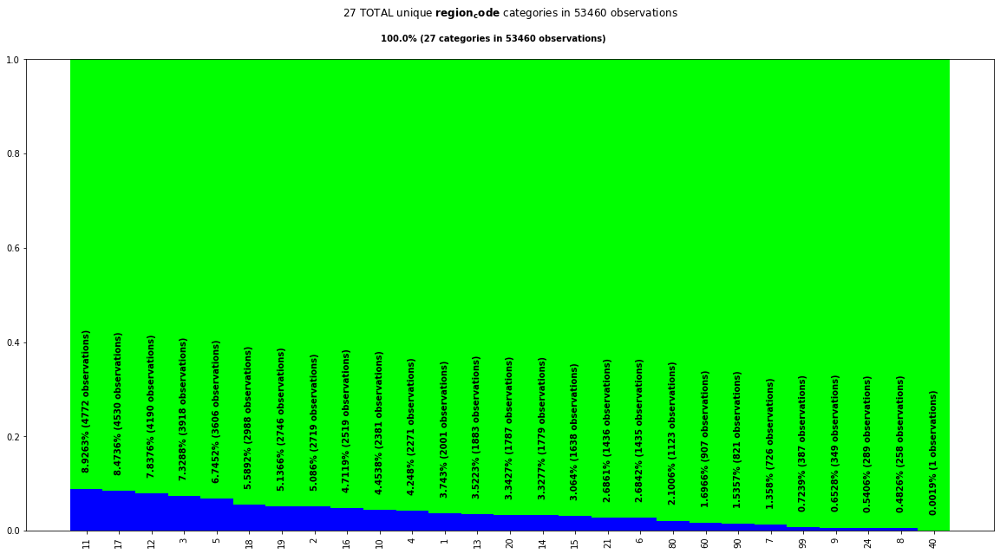

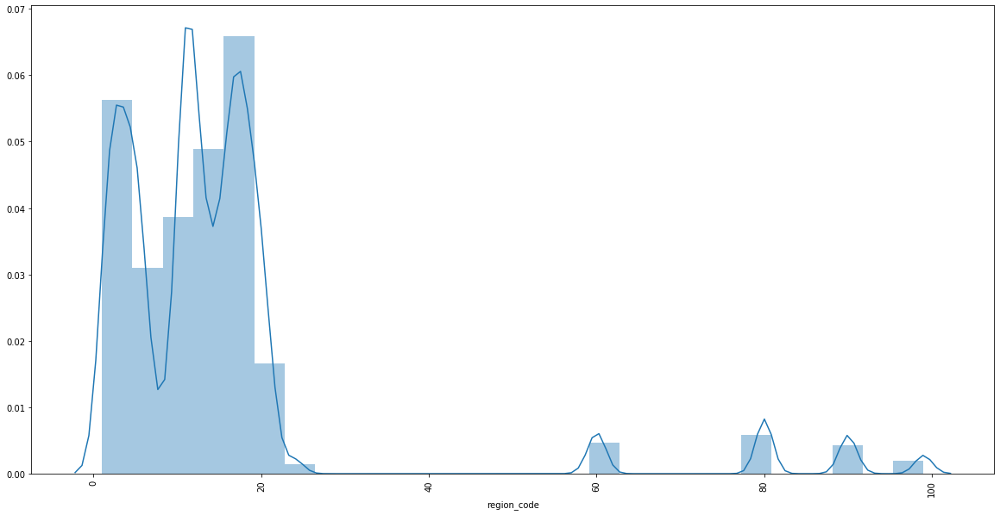

In [111]:
scjpnutils.analyze_distributions(
    X_train, 
    'X_train', 
    'region_code'
);

In [112]:
region_code_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['region_code'], 
    'region_code', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{region_code_strat_transformer.description}</font></i></h5>"))

X_train = region_code_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['(prefit) target-encoder (LOO==False, post_encode_null_to_global_mean==True) transform: region_code', FunctionTransformer(func=<function C__target_encode__StrategyTransformer.get_transformer.<locals>.<lambda> at 0x7fd72e9d2d40>)] appended to pipeline
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM INFO **: unique categories of 'region_code' in X match those that were previously fit
added new feature: region_code_target_encoded
['drop after target encoding: region_code', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd71d85f890>] appended to pipeline
dropped feature region_code after target encoding
strategy transformation for feature region_code COMPLETE


This feature is good to go.

#### Feature Analysis: *district_code*

As with <b>region_code</b>, <b>district_code</b> has no null/missing values.

This is also clearly a categorical (but not ordinal) variable.  

We should be able to use this feature as is.

Let's have a look at value-counts.

In [113]:
X_train.district_code.value_counts()

1     10979
2     10048
3      9018
4      8077
5      3916
6      3697
7      3014
8       943
30      884
33      787
53      659
43      445
13      355
23      273
63      173
62       99
60       55
0        21
80       11
67        6
Name: district_code, dtype: int64

And its distribution...

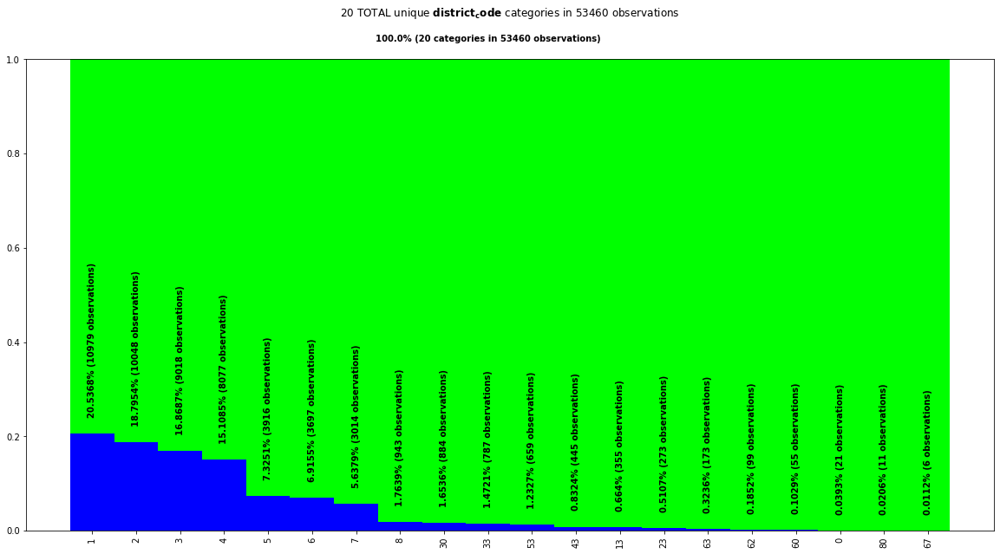

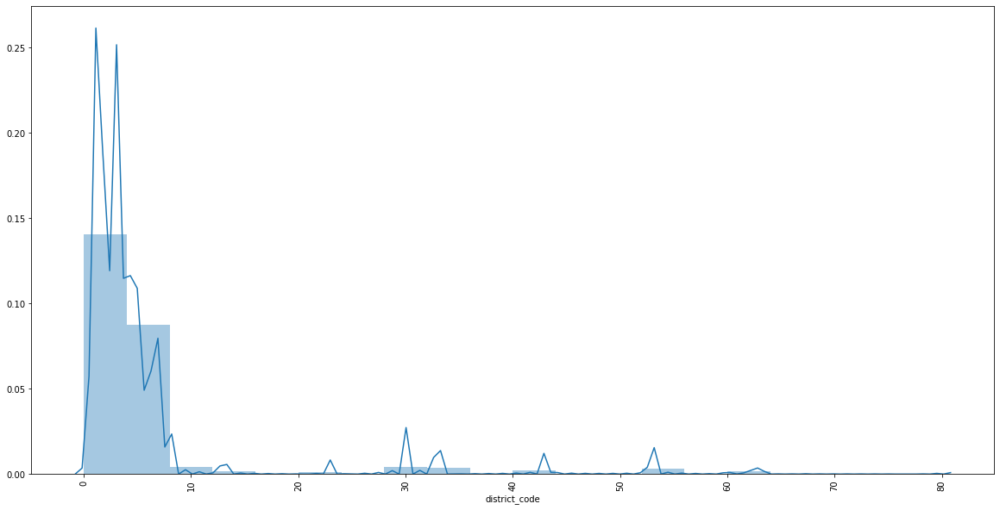

In [114]:
scjpnutils.analyze_distributions(
    X_train, 
    'X_train', 
    'district_code'
);

In [115]:
district_code_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['district_code'], 
    'district_code', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{district_code_strat_transformer.description}</font></i></h5>"))

X_train = district_code_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['(prefit) target-encoder (LOO==False, post_encode_null_to_global_mean==True) transform: district_code', FunctionTransformer(func=<function C__target_encode__StrategyTransformer.get_transformer.<locals>.<lambda> at 0x7fd71d9ee950>)] appended to pipeline
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM INFO **: unique categories of 'district_code' in X match those that were previously fit
added new feature: district_code_target_encoded
['drop after target encoding: district_code', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd72ee60590>] appended to pipeline
dropped feature district_code after target encoding
strategy transformation for feature district_code COMPLETE


This feature is good to go.

Let's move on to feature kind <b>geographic_location</b> (not coded).

<p><br><br>

In [116]:
display_feature_kind('geographic_location')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,subvillage,object,18331,"['A' Kati, 1, 14Kambalage, 18, 19, 20, 22B, 23...",0.342892,65.71,335,0.006266,"Int64Index([57269, 21287, 33378, 6502, 7898,..."
1,region,object,21,"[Arusha, Dar es Salaam, Dodoma, Iringa, Kagera...",0.000393,99.96,0,0.000000,None
2,lga,object,124,"[Arusha Rural, Arusha Urban, Babati, Bagamoyo,...",0.002319,99.77,0,0.000000,None
3,ward,object,2087,"[Aghondi, Akheri, Arash, Arri, Arusha Chini, B...",0.039039,96.10,0,0.000000,None


Keying off of the descriptions provided, these features represent, in string (name) format, information we already have encoded by <b>geographic_location_coded</b> <i>kind</i> features.  So we can short-circuit analysis and just remove them as "non-contributing" features.

But we still need to add the steps to drop these features to the `Pipeline`.

In [117]:
dct_non_contrib__geo_loc = DropColumnsTransformer(['region', 'lga', 'ward', 'subvillage'])
pipeline_data_preprocessor.steps.append(['drop non-contributing features: region, lga, ward, and subvillage', dct_non_contrib__geo_loc])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

Let's move on to feature kind <b>population</b>.

<p><br><br>

In [118]:
display_feature_kind('population')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,population,int64,1019,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...",0.019061,98.09,0,0.0,None


#### Feature Analysis: *population*

There are no null/missing values.

It is a categorical (ordinal) variable.  

We should be able to use this feature as is.

Let's have a look at value-counts.

In [119]:
X_train.population.value_counts()

0       19310
1        6327
200      1728
150      1686
250      1511
        ...  
2807        1
726         1
694         1
4788        1
687         1
Name: population, Length: 1019, dtype: int64

And its distribution...

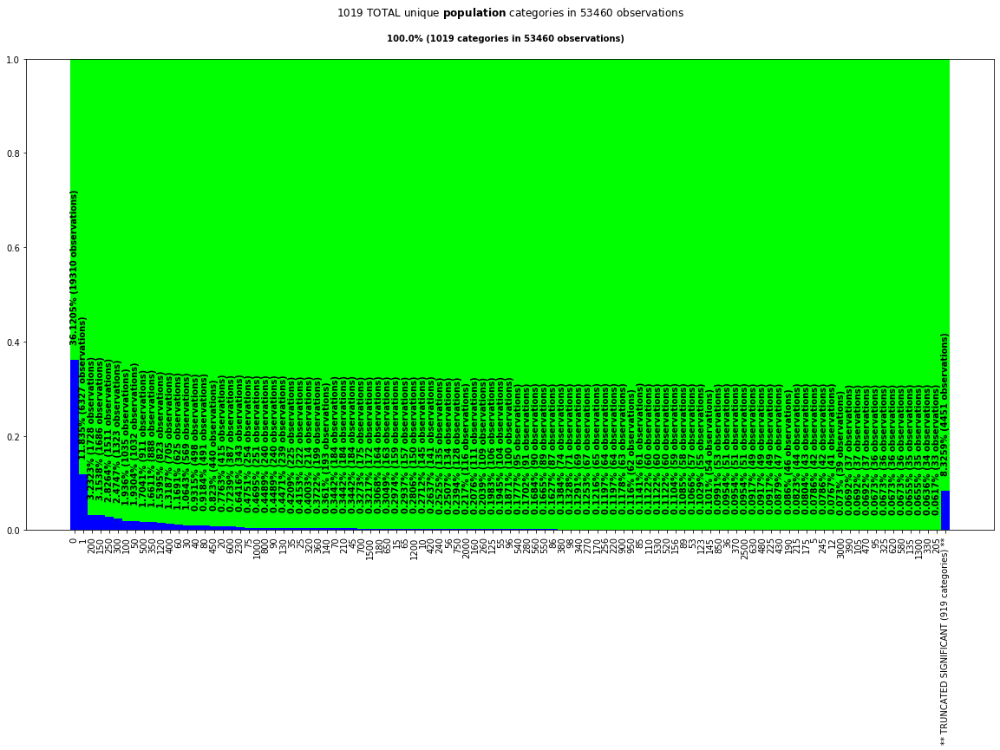

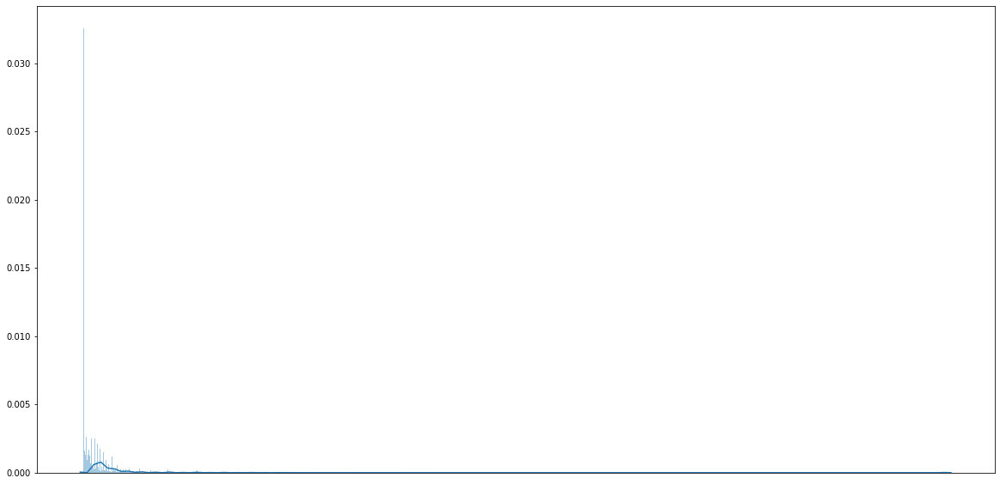

In [120]:
scjpnutils.analyze_distributions(
    X_train, 
    'X_train', 
    'population'
);

We must consider the possibility that <b>population</b> is continuous and then look at the outliers scenario.

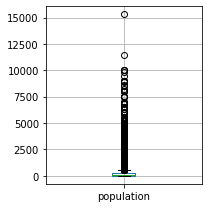

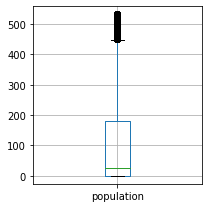

,feature,dtype,q1,q3,IQR_lower_bound,IQR_upper_bound,n_outliers,n_outliers_ratio,outliers_index
0,population,float64,0.0,179.951496,-269.927245,449.878741,1849,0.034587,"Int64Index([38945, 14207, 19721, 23746, 29405,..."


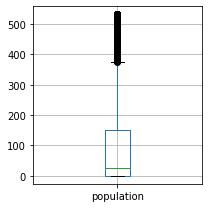

,feature,dtype,q1,q3,IQR_lower_bound,IQR_upper_bound,n_outliers,n_outliers_ratio,outliers_index
0,population,float64,0.0,150.0,-225.0,375.0,3052,0.057089,"Int64Index([38945, 57631, 14207, 19721, 51979,..."


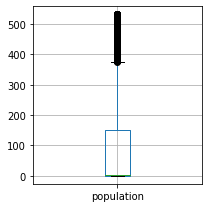

,feature,dtype,q1,q3,IQR_lower_bound,IQR_upper_bound,n_outliers,n_outliers_ratio,outliers_index
0,population,int64,0.0,150.0,-225.0,375.0,3052,0.057089,"Int64Index([38945, 57631, 14207, 19721, 51979,..."


In [121]:
scjpnutils.analyze_outliers_detailed(
    X_train, 
    'X_train', 
    'population', 
    top_percentile=35, 
    outlier_ratio_reduction_threshold=.10
);

If we assume <b>population</b> is continuous, then no strategy above will remove outliers entirely.  We are in a similar with this feature as we were in with **amount_tsh**.

In [122]:
population_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['population'], 
    'population', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{population_strat_transformer.description}</font></i></h5>"))

X_train = population_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['replace population outliers with mean', <scjpnlib.utils.skl_transformers.SimpleValueTransformer object at 0x7fd72e9de090>] appended to pipeline
strategy transformation for feature population COMPLETE


Let's move on to feature kind <b>public_meeting</b>.

<p><br><br>

In [123]:
display_feature_kind('public_meeting')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,public_meeting,object,3,"[False, True, nan]",0.000056,99.99,3006,0.056229,"Int64Index([32908, 12197, 64825, 50761, 52163,..."


#### Feature Analysis: *public_meeting*

There are null/missing values we must deal with.  We will replace null/missing values with `False`.

Doing this will also implicitly convert it to its proper type (`bool`).

In [124]:
# val counts before replacing nulls
X_train.public_meeting.value_counts(normalize=True)

True     0.909759
False    0.090241
Name: public_meeting, dtype: float64

In [125]:
missing_bool_value_replacement = False

replace_null_rules = {'public_meeting': [{'missing_values': np.nan, 'strategy': 'constant', 'fill_value': missing_bool_value_replacement}]}
svt_null_public_meeting = SimpleValueTransformer(replace_null_rules)
pipeline_data_preprocessor.steps.append(['impute \'none\' for missing values: public_meeting', svt_null_public_meeting])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

In [126]:
X_train.public_meeting.value_counts(normalize=True)

True     0.858605
False    0.141395
Name: public_meeting, dtype: float64

Let's move on to feature kind <b>recorded_by</b>.

<p><br><br>

In [127]:
display_feature_kind('recorded_by')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,recorded_by,object,1,[GeoData Consultants Ltd],0.000019,100.0,0,0.0,None


#### Feature Analysis: *recorded_by*

This feature is obviously non-contributing since it contains only 1 unique value.

We will drop it.

In [128]:
dct_non_contrib__recorded_by = DropColumnsTransformer(['recorded_by'])
pipeline_data_preprocessor.steps.append(['drop non-contributing features: recorded_by', dct_non_contrib__recorded_by])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

Let's move on to feature kind <b>wpt_operator</b>.

<p><br><br>

In [129]:
display_feature_kind('wpt_operator')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,scheme_management,object,13,"[Company, None, Other, Parastatal, Private ope...",0.000243,99.98,3503,0.065526,"Int64Index([36420, 7651, 41429, 14391, 64446,..."
1,scheme_name,object,2636,"[14 Kambarage, A, ADP, ADP Simbo, ADP Simbu, A...",0.049308,95.07,25363,0.474429,"Int64Index([38945, 1186, 36420, 57631, 51349,..."


#### Feature Analysis: *scheme_management*

We need to deal with its null/missing values.

As usual, we'll first imput lower-case and then check for existing "none"-type categories.

In [130]:
ft_impute_lcase_scheme_management = FunctionTransformer(lambda X: impute_lcase(X, 'scheme_management'), validate=False)
pipeline_data_preprocessor.steps.append(['impute lower case: scheme_management', ft_impute_lcase_scheme_management])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

# finally, check to see if there is an appropriate existing value in X_labeled.funder to indicate null - e.g. 'none', 'unknown', 'not known', etc.
scjpnutils.index_of_values(X_train, 'X_train', 'scheme_management', ['none', 'unknown', 'not known'])

(array([47327]), array(['none'], dtype=object))

So we will not need to create a new category to replace null/missing values...

In [131]:
replace_null_rules = {'scheme_management': [{'missing_values': np.nan, 'strategy': 'constant', 'fill_value': missing_string_value_replacement}]}
svt_null_scheme_management = SimpleValueTransformer(replace_null_rules)
pipeline_data_preprocessor.steps.append(['impute \'none\' for missing values: scheme_management', svt_null_scheme_management])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

And now its distribution...

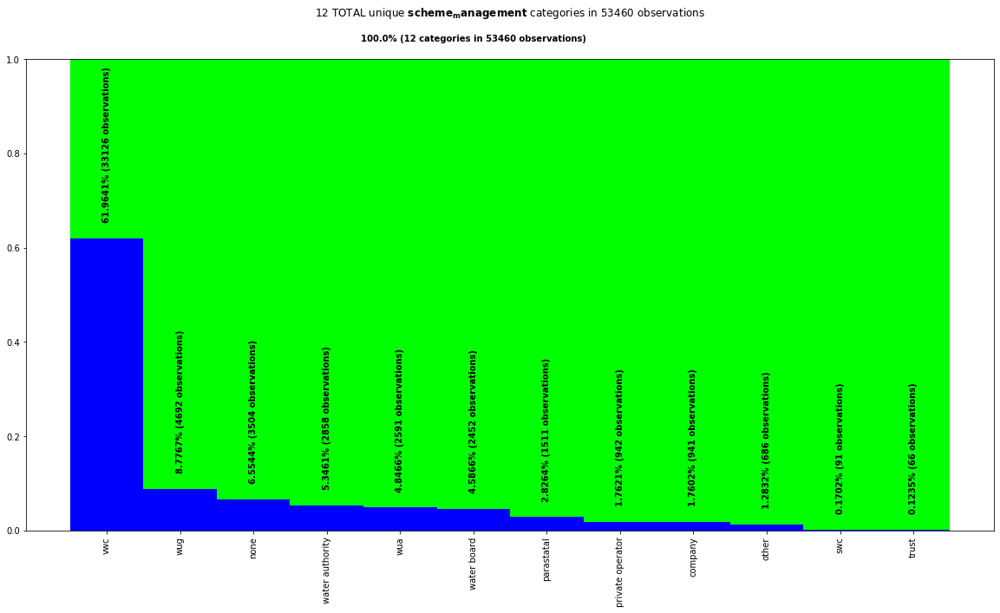

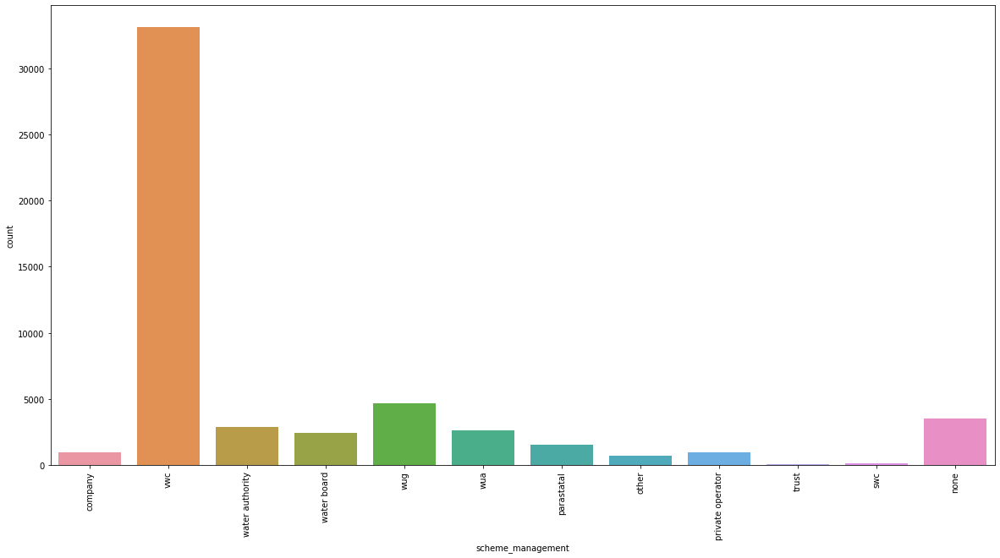

In [132]:
scjpnutils.analyze_distributions(
    X_train, 
    'X_train', 
    'scheme_management'
);

In [133]:
scheme_management_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['scheme_management'], 
    'scheme_management', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{scheme_management_strat_transformer.description}</font></i></h5>"))

X_train = scheme_management_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['(prefit) target-encoder (LOO==False, post_encode_null_to_global_mean==True) transform: scheme_management', FunctionTransformer(func=<function C__target_encode__StrategyTransformer.get_transformer.<locals>.<lambda> at 0x7fd71d0755f0>)] appended to pipeline
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM INFO **: unique categories of 'scheme_management' in X match those that were previously fit
added new feature: scheme_management_target_encoded
['drop after target encoding: scheme_management', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd72e9ea850>] appended to pipeline
dropped feature scheme_management after target encoding
strategy transformation for feature scheme_management COMPLETE


#### Feature Analysis: *scheme_name*

We need to deal with its null/missing values.

As usual, we'll first imput lower-case and then check for existing "none"-type categories.

In [134]:
ft_impute_lcase_scheme_name = FunctionTransformer(lambda X: impute_lcase(X, 'scheme_name'), validate=False)
pipeline_data_preprocessor.steps.append(['impute lower case: scheme_name', ft_impute_lcase_scheme_name])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

# finally, check to see if there is an appropriate existing value in X_labeled.funder to indicate null - e.g. 'none', 'unknown', 'not known', etc.
scjpnutils.index_of_values(X_train, 'X_train', 'scheme_name', ['none', 'unknown', 'not known'])

(array([   55,    65,    92,    95,   112,   145,   236,   256,   274,
          357,   384,   398,   463,   534,   543,   545,   560,   573,
          591,   623,   684,   806,   921,   935,   939,   999,  1066,
         1070,  1072,  1096,  1206,  1224,  1268,  1376,  1492,  1544,
         1574,  1705,  1706,  1719,  1735,  1757,  1793,  1807,  1849,
         1864,  1909,  2110,  2237,  2308,  2343,  2354,  2406,  2430,
         2431,  2457,  2512,  2542,  2575,  2666,  2789,  2832,  2877,
         2924,  2927,  2939,  2945,  2995,  3008,  3039,  3046,  3081,
         3232,  3241,  3244,  3262,  3318,  3331,  3337,  3338,  3375,
         3387,  3412,  3505,  3508,  3513,  3599,  3651,  3669,  3702,
         3819,  3826,  3839,  3895,  3959,  4011,  4056,  4109,  4145,
         4196,  4214,  4234,  4270,  4283,  4314,  4344,  4381,  4501,
         4564,  4664,  4688,  4877,  4880,  4904,  4925,  4982,  4987,
         5041,  5051,  5083,  5104,  5128,  5190,  5243,  5254,  5308,
      

We will replace null/missing values with "none".

We will replace "not known" with "unknown".

In [135]:
replace_null_rules = {'scheme_name': [{'missing_values': np.nan, 'strategy': 'constant', 'fill_value': missing_string_value_replacement}]}
svt_null_scheme_name = SimpleValueTransformer(replace_null_rules)
pipeline_data_preprocessor.steps.append(['impute \'none\' for missing values: scheme_name', svt_null_scheme_name])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

In [136]:
replace_same_concept_words = {'scheme_name': [{'missing_values': "not known", 'strategy': 'constant', 'fill_value': "unknown"}]}
svt_not_known_scheme_name = SimpleValueTransformer(replace_same_concept_words)
pipeline_data_preprocessor.steps.append(['replace same concept words: scheme_name', svt_not_known_scheme_name])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

And now the distribution...

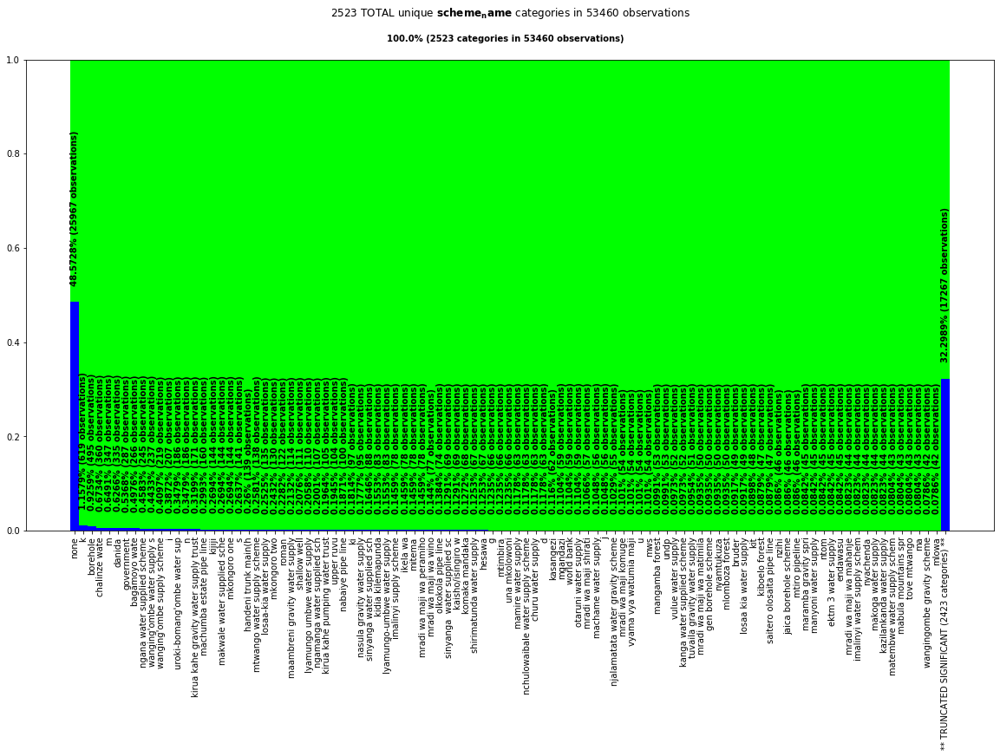

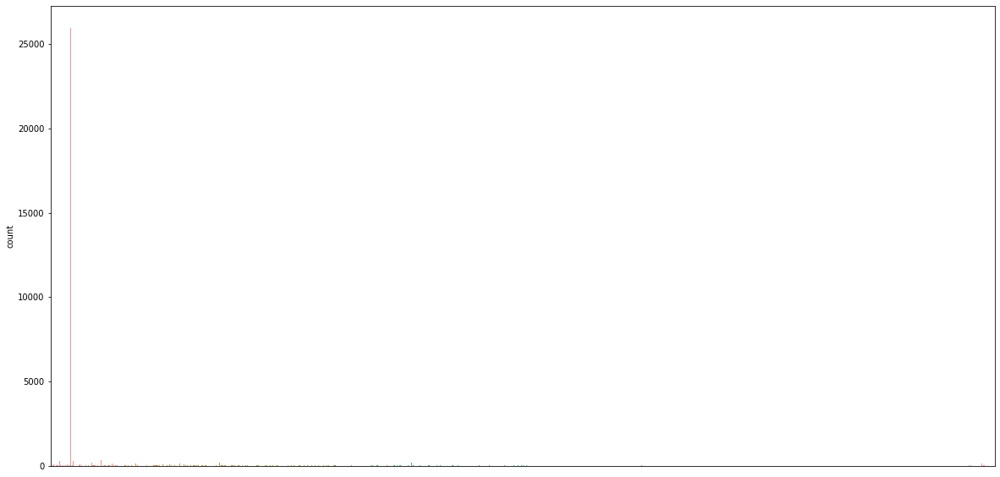

In [137]:
scjpnutils.analyze_distributions(
    X_train, 
    'X_train', 
    'scheme_name'
);

We will again employ the `tfidf_kmeans_classify_feature` function to classify <b>scheme_name</b>.

But before we do so, let's see how bad duplication is so we are sure it is indeed needed.

In [138]:
scjpnutils.analyze_non_alphanumeric_strings(X_train[['scheme_name']], 'X_train <i>scheme_name</i>');

,feature,n_unique,n_non_alphanumeric_str,non_alphanumeric_str_index
0,scheme_name,2523,16629,"Int64Index([56146, 11841, 57940, 44503, 31018,..."


YIKES!  There appears to be much duplication.

In [139]:
# ft_tfidf_kmeans_classify_scheme_name = FunctionTransformer(
#     lambda X: scjpnsubmodels.tfidf_kmeans_classify_feature(
#         X, 
#         '', 
#         'scheme_name', 
#         verbose=0
#     )[0], 
#     validate=False
# )
# X_labeled_clean = ft_tfidf_kmeans_classify_scheme_name.fit_transform(X_labeled_clean)

# # add this step to the pipeline
# pipeline_data_preprocessor.steps.append(['tfidf-kmeans-classify: scheme_name', ft_tfidf_kmeans_classify_scheme_name])

In [140]:
scheme_name_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['scheme_name'], 
    'scheme_name', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{scheme_name_strat_transformer.description}</font></i></h5>"))

X_train = scheme_name_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['(prefit) target-encoder (LOO==False, post_encode_null_to_global_mean==True) transform: scheme_name', FunctionTransformer(func=<function C__target_encode__StrategyTransformer.get_transformer.<locals>.<lambda> at 0x7fd71d255d40>)] appended to pipeline
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM INFO **: unique categories of 'scheme_name' in X match those that were previously fit
added new feature: scheme_name_target_encoded
['drop after target encoding: scheme_name', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd72e9f2c10>] appended to pipeline
dropped feature scheme_name after target encoding
strategy transformation for feature scheme_name COMPLETE


Let's move on to feature kind <b>permit</b>.

<p><br><br>

In [141]:
display_feature_kind('permit')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,permit,object,3,"[False, True, nan]",0.000056,99.99,2733,0.051122,"Int64Index([63991, 59068, 65345, 67177, 64003,..."


#### Feature Analysis: *permit*

There are null/missing values we must deal with.  We will replace null/missing values with `False`.

Doing this will also implicitly convert it to its proper type (`bool`).

In [142]:
# val counts before replacing nulls
X_train.permit.value_counts(normalize=True)

True     0.688706
False    0.311294
Name: permit, dtype: float64

In [143]:
replace_null_rules = {'permit': [{'missing_values': np.nan, 'strategy': 'constant', 'fill_value': missing_bool_value_replacement}]}
svt_null_permit = SimpleValueTransformer(replace_null_rules)
pipeline_data_preprocessor.steps.append(['impute \'none\' for missing values: permit', svt_null_permit])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

In [144]:
X_train.permit.value_counts(normalize=True)

True     0.653498
False    0.346502
Name: permit, dtype: float64

Let's move on to feature kind <b>wpt_extraction_type_class</b>.

<p><br><br>

In [145]:
display_feature_kind('wpt_extraction_type_class')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,extraction_type,object,18,"[afridev, cemo, climax, gravity, india mark ii...",0.000337,99.97,0,0.0,None
1,extraction_type_group,object,13,"[afridev, gravity, india mark ii, india mark i...",0.000243,99.98,0,0.0,None
2,extraction_type_class,object,7,"[gravity, handpump, motorpump, other, rope pum...",0.000131,99.99,0,0.0,None


These are relatively low cardinality categorical features that seem to have some overlap.  Let's formalize this overlap-analysis.

In [146]:
scjpnutils.analyze_overlap(
    'wpt_extraction_type_class', 
    predictors_kind_classification['wpt_extraction_type_class']['features'], 
    'X_train', 
    X_train,
    suppress_value_analysis_output=True
)

,extraction_type,extraction_type_class
id,,
31018,mono,motorpump
10292,ksb,submersible
63110,ksb,submersible
49184,ksb,submersible
64825,mono,motorpump
5429,windmill,wind-powered
62908,nira/tanira,handpump
17160,ksb,submersible
53413,cemo,motorpump


,extraction_type,extraction_type_group
id,,
10292,ksb,submersible
63110,ksb,submersible
49184,ksb,submersible
5429,windmill,wind-powered
17160,ksb,submersible
53413,cemo,other motorpump
26443,ksb,submersible
18975,ksb,submersible
38916,ksb,submersible


,extraction_type_group,extraction_type_class
id,,
31018,mono,motorpump
64825,mono,motorpump
62908,nira/tanira,handpump
53413,other motorpump,motorpump
58697,nira/tanira,handpump
66523,mono,motorpump
50875,mono,motorpump
65369,nira/tanira,handpump
73222,nira/tanira,handpump


We will settle on keeping <b>extraction_type</b> since it basically contains the other two features and has more information.

First, we will target encode <b>extraction_type</b>.

In [147]:
extraction_type_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['extraction_type'], 
    'extraction_type', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{extraction_type_strat_transformer.description}</font></i></h5>"))

X_train = extraction_type_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['(prefit) target-encoder (LOO==False, post_encode_null_to_global_mean==True) transform: extraction_type', FunctionTransformer(func=<function C__target_encode__StrategyTransformer.get_transformer.<locals>.<lambda> at 0x7fd71d255dd0>)] appended to pipeline
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM INFO **: unique categories of 'extraction_type' in X match those that were previously fit
added new feature: extraction_type_target_encoded
['drop after target encoding: extraction_type', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd735130e90>] appended to pipeline
dropped feature extraction_type after target encoding
strategy transformation for feature extraction_type COMPLETE


And now drop the others as non-contributing features...

In [148]:
dct_non_contrib__wpt_extraction_type_class = DropColumnsTransformer(['extraction_type_group', 'extraction_type_class'])
pipeline_data_preprocessor.steps.append(['drop non-contributing feature: extraction_type_group, extraction_type_class', dct_non_contrib__wpt_extraction_type_class])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

Let's move on to feature kind <b>wpt_management</b>.

<p><br><br>

In [149]:
display_feature_kind('wpt_management')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,management,object,12,"[company, other, other - school, parastatal, p...",0.000224,99.98,0,0.0,None
1,management_group,object,5,"[commercial, other, parastatal, unknown, user-...",0.000094,99.99,0,0.0,None


Again, these relatively low cardinality categorical features seem to have some overlap.

In [150]:
scjpnutils.analyze_overlap(
    'wpt_management', 
    predictors_kind_classification['wpt_management']['features'], 
    'X_train', 
    X_train,
    suppress_value_analysis_output=True
)

,management,management_group
id,,
56146,company,commercial
11841,vwc,user-group
14207,water board,user-group
57940,water board,user-group
49053,vwc,user-group
36909,vwc,user-group
16274,vwc,user-group
44503,water board,user-group
29709,wug,user-group


It turns out the population does not actually manifest much overlap.  But it is clear that some information is duplicated by these categorites.

We will therefore settle on keeping <b>management</b> since it contains more information.

First, we need to target encode <b>management</b>.

In [151]:
management_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['management'], 
    'management', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{management_strat_transformer.description}</font></i></h5>"))

X_train = management_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['(prefit) target-encoder (LOO==False, post_encode_null_to_global_mean==True) transform: management', FunctionTransformer(func=<function C__target_encode__StrategyTransformer.get_transformer.<locals>.<lambda> at 0x7fd71d255710>)] appended to pipeline
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM INFO **: unique categories of 'management' in X match those that were previously fit
added new feature: management_target_encoded
['drop after target encoding: management', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd73515c790>] appended to pipeline
dropped feature management after target encoding
strategy transformation for feature management COMPLETE


And now drop the other one as a non-contributing feature...

In [152]:
dct_non_contrib__wpt_management = DropColumnsTransformer(['management_group'])
pipeline_data_preprocessor.steps.append(['drop non-contributing feature: management_group', dct_non_contrib__wpt_management])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

Let's move on to feature kind <b>payment_frequency_class</b>.

<p><br><br>

In [153]:
display_feature_kind('payment_frequency_class')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,payment,object,7,"[never pay, other, pay annually, pay monthly, ...",0.000131,99.99,0,0.0,None
1,payment_type,object,7,"[annually, monthly, never pay, on failure, oth...",0.000131,99.99,0,0.0,None


These two features obviously overlap but let's formalize this.

In [154]:
scjpnutils.analyze_overlap(
    'payment_frequency_class', 
    predictors_kind_classification['payment_frequency_class']['features'], 
    'X_train', 
    X_train,
    suppress_value_analysis_output=True
)

,payment,payment_type
id,,
56146,pay monthly,monthly
14207,pay monthly,monthly
57940,pay monthly,monthly
49053,pay annually,annually
36909,pay annually,annually
16274,pay annually,annually
44503,pay per bucket,per bucket
29709,pay per bucket,per bucket
67564,pay per bucket,per bucket


Since these are basically semantically identical, we will go with the less wordy one: <b>payment_type</b>.

Let's target encode it first.

In [155]:
payment_type_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['payment_type'], 
    'payment_type', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{payment_type_strat_transformer.description}</font></i></h5>"))

X_train = payment_type_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['(prefit) target-encoder (LOO==False, post_encode_null_to_global_mean==True) transform: payment_type', FunctionTransformer(func=<function C__target_encode__StrategyTransformer.get_transformer.<locals>.<lambda> at 0x7fd71d255c20>)] appended to pipeline
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM INFO **: unique categories of 'payment_type' in X match those that were previously fit
added new feature: payment_type_target_encoded
['drop after target encoding: payment_type', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd72e9d8850>] appended to pipeline
dropped feature payment_type after target encoding
strategy transformation for feature payment_type COMPLETE


And now drop the other one as a non-contributing feature...

In [156]:
dct_non_contrib__payment_frequency_class = DropColumnsTransformer(['payment'])
pipeline_data_preprocessor.steps.append(['drop non-contributing feature: payment', dct_non_contrib__payment_frequency_class])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

Let's move on to feature kind <b>water_quality_class</b>.

<p><br><br>

In [157]:
display_feature_kind('water_quality_class')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,water_quality,object,8,"[coloured, fluoride, fluoride abandoned, milky...",0.000150,99.99,0,0.0,None
1,quality_group,object,6,"[colored, fluoride, good, milky, salty, unknown]",0.000112,99.99,0,0.0,None


Again, we seem to have overlap...

In [158]:
scjpnutils.analyze_overlap(
    'water_quality_class', 
    predictors_kind_classification['water_quality_class']['features'], 
    'X_train', 
    X_train,
    suppress_value_analysis_output=True
)

,water_quality,quality_group
id,,
56146,soft,good
11841,soft,good
14207,soft,good
57940,soft,good
49053,soft,good
36909,soft,good
16274,soft,good
44503,soft,good
29709,soft,good


We will go with <b>water_quality</b> since it contains more information.  We must note that "soft" is equivalent to "good".  We don't really need to go as far as replacing this value, however, since we will be target-encoding it anyway.

In [159]:
water_quality_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['water_quality'], 
    'water_quality', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{water_quality_strat_transformer.description}</font></i></h5>"))

X_train = water_quality_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['(prefit) target-encoder (LOO==False, post_encode_null_to_global_mean==True) transform: water_quality', FunctionTransformer(func=<function C__target_encode__StrategyTransformer.get_transformer.<locals>.<lambda> at 0x7fd71d2557a0>)] appended to pipeline
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM INFO **: unique categories of 'water_quality' in X match those that were previously fit
added new feature: water_quality_target_encoded
['drop after target encoding: water_quality', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd72d217a90>] appended to pipeline
dropped feature water_quality after target encoding
strategy transformation for feature water_quality COMPLETE


In [160]:
dct_non_contrib__water_quality_class = DropColumnsTransformer(['quality_group'])
pipeline_data_preprocessor.steps.append(['drop non-contributing feature: quality_group', dct_non_contrib__water_quality_class])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

Let's move on to feature kind <b>water_quantity_class</b>.

<p><br><br>

In [161]:
display_feature_kind('water_quantity_class')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,quantity,object,5,"[dry, enough, insufficient, seasonal, unknown]",0.000094,99.99,0,0.0,None
1,quantity_group,object,5,"[dry, enough, insufficient, seasonal, unknown]",0.000094,99.99,0,0.0,None


Wow!  Do we even need to bother checking overlap officially?

In [162]:
scjpnutils.analyze_overlap(
    'water_quantity_class', 
    predictors_kind_classification['water_quantity_class']['features'], 
    'X_train', 
    X_train,
    suppress_value_analysis_output=True
)

,quantity,quantity_group
id,,


So they are identical in every observation!

We will go with <b>quantity</b> based solely on its shorter name.

Of course, we need to target-encode it first.

In [163]:
quantity_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['quantity'], 
    'quantity', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{quantity_strat_transformer.description}</font></i></h5>"))

X_train = quantity_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['(prefit) target-encoder (LOO==False, post_encode_null_to_global_mean==True) transform: quantity', FunctionTransformer(func=<function C__target_encode__StrategyTransformer.get_transformer.<locals>.<lambda> at 0x7fd71d255320>)] appended to pipeline
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM INFO **: unique categories of 'quantity' in X match those that were previously fit
added new feature: quantity_target_encoded
['drop after target encoding: quantity', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd72d21add0>] appended to pipeline
dropped feature quantity after target encoding
strategy transformation for feature quantity COMPLETE


And now drop the other one as a non-contributing feature...

In [164]:
dct_non_contrib__water_quantity_class = DropColumnsTransformer(['quantity_group'])
pipeline_data_preprocessor.steps.append(['drop non-contributing feature: quantity_group', dct_non_contrib__water_quantity_class])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

Let's move on to feature kind <b>water_source_type_class</b>.

<p><br><br>

In [165]:
display_feature_kind('water_source_type_class')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,source,object,10,"[dam, hand dtw, lake, machine dbh, other, rain...",0.000187,99.98,0,0.0,None
1,source_type,object,7,"[borehole, dam, other, rainwater harvesting, r...",0.000131,99.99,0,0.0,None
2,source_class,object,3,"[groundwater, surface, unknown]",0.000056,99.99,0,0.0,None


The overlapping situation is now so obvious here.  Let's formalize it.

In [166]:
scjpnutils.analyze_overlap(
    'water_source_type_class', 
    predictors_kind_classification['water_source_type_class']['features'], 
    'X_train', 
    X_train,
    suppress_value_analysis_output=True
)

,source,source_type
id,,
14207,river,river/lake
44503,river,river/lake
29709,machine dbh,borehole
66515,machine dbh,borehole
54931,machine dbh,borehole
33361,river,river/lake
10292,river,river/lake
57441,river,river/lake
12631,machine dbh,borehole


,source_type,source_class
id,,
56146,spring,groundwater
11841,spring,groundwater
14207,river/lake,surface
57940,spring,groundwater
49053,spring,groundwater
36909,spring,groundwater
16274,spring,groundwater
44503,river/lake,surface
29709,borehole,groundwater


,source,source_class
id,,
56146,spring,groundwater
11841,spring,groundwater
14207,river,surface
57940,spring,groundwater
49053,spring,groundwater
36909,spring,groundwater
16274,spring,groundwater
44503,river,surface
29709,machine dbh,groundwater


<b>source</b> seems to contain the most information so we will go with that.

As usual, it needs to be target-encoded.

In [167]:
source_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['source'], 
    'source', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{source_strat_transformer.description}</font></i></h5>"))

X_train = source_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['(prefit) target-encoder (LOO==False, post_encode_null_to_global_mean==True) transform: source', FunctionTransformer(func=<function C__target_encode__StrategyTransformer.get_transformer.<locals>.<lambda> at 0x7fd71dab2b90>)] appended to pipeline
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM INFO **: unique categories of 'source' in X match those that were previously fit
added new feature: source_target_encoded
['drop after target encoding: source', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd7351306d0>] appended to pipeline
dropped feature source after target encoding
strategy transformation for feature source COMPLETE


Drop the other non-contributing features...

In [168]:
dct_non_contrib__water_source_type_class = DropColumnsTransformer(['source_type', 'source_class'])
pipeline_data_preprocessor.steps.append(['drop non-contributing feature: source_type, source_class', dct_non_contrib__water_source_type_class])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

Let's move on to the FINAL feature kind <b>wpt_type_class</b>.

<p><br><br>

In [169]:
display_feature_kind('wpt_type_class')

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,waterpoint_type,object,7,"[cattle trough, communal standpipe, communal s...",0.000131,99.99,0,0.0,None
1,waterpoint_type_group,object,6,"[cattle trough, communal standpipe, dam, hand ...",0.000112,99.99,0,0.0,None


Obviously there is some overlap againn.

In [170]:
scjpnutils.analyze_overlap(
    'wpt_type_class', 
    predictors_kind_classification['wpt_type_class']['features'], 
    'X_train', 
    X_train,
    suppress_value_analysis_output=True
)

,waterpoint_type,waterpoint_type_group
id,,
14207,communal standpipe multiple,communal standpipe
22213,communal standpipe multiple,communal standpipe
67423,communal standpipe multiple,communal standpipe
34780,communal standpipe multiple,communal standpipe
71202,communal standpipe multiple,communal standpipe
45665,communal standpipe multiple,communal standpipe
38327,communal standpipe multiple,communal standpipe
5429,communal standpipe multiple,communal standpipe
20620,communal standpipe multiple,communal standpipe


Again, we will go with the feature that contains more information: <b>waterpoint_type</b>.

It must be target-encoded.

In [171]:
waterpoint_type_strat_transformer = scjpnutils.instantiate_strategy_transfomer(
    eda_config['variable_transformation_strategies']['waterpoint_type'], 
    'waterpoint_type', 
    pipeline_data_preprocessor
)
display(HTML(f"<h5>description of this stratgy: <i><font color='blue'>{waterpoint_type_strat_transformer.description}</font></i></h5>"))

X_train = waterpoint_type_strat_transformer.fit_transform(X_train, y_train_encoded.status_group)

['(prefit) target-encoder (LOO==False, post_encode_null_to_global_mean==True) transform: waterpoint_type', FunctionTransformer(func=<function C__target_encode__StrategyTransformer.get_transformer.<locals>.<lambda> at 0x7fd71dab2830>)] appended to pipeline
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM INFO **: unique categories of 'waterpoint_type' in X match those that were previously fit
added new feature: waterpoint_type_target_encoded
['drop after target encoding: waterpoint_type', <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd73514d2d0>] appended to pipeline
dropped feature waterpoint_type after target encoding
strategy transformation for feature waterpoint_type COMPLETE


Drop the other non-contributing feature...

In [172]:
dct_non_contrib__wpt_type_class = DropColumnsTransformer(['waterpoint_type_group'])
pipeline_data_preprocessor.steps.append(['drop non-contributing feature: waterpoint_type_group', dct_non_contrib__wpt_type_class])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

<p><br><br>
    
# Supplemental/Follow-up Analysis

## Second Look at: *installer*, *funder*, *scheme_name*

In [173]:
similar_categories = ['funder', 'installer', 'scheme_name']

df_similar_categories = ft_impute_lcase_funder.fit_transform(labeled_with_target)[similar_categories]
df_similar_categories = svt_null_funder.fit_transform(df_similar_categories)
df_similar_categories = svt_not_known_funder.fit_transform(df_similar_categories)

df_similar_categories = ft_impute_lcase_installer.fit_transform(df_similar_categories)
df_similar_categories = svt_null_installer.fit_transform(df_similar_categories)
df_similar_categories = svt_not_known_installer.fit_transform(df_similar_categories)

df_similar_categories = ft_impute_lcase_scheme_name.fit_transform(df_similar_categories)
df_similar_categories = svt_null_scheme_name.fit_transform(df_similar_categories)
df_similar_categories = svt_not_known_scheme_name.fit_transform(df_similar_categories)


scjpnutils.analyze_overlap(
    'similar looking categories', 
    similar_categories, 
    'df_similar_categories', 
    df_similar_categories,
    suppress_value_analysis_output=True
);

,funder,scheme_name
id,,
2,lvia,mgun
3,germany republi,losaa-kia water supply
7,water,lwih
8,water,ipal
9,ded,mapinduzi
11,kwa makala,mkalamo water supply
16,songea district council,mradi wa maji wa kilagano
17,world bank,mlimani pipe line
18,water,msin


,installer,scheme_name
id,,
2,lvia,mgun
3,ces,losaa-kia water supply
7,gover,lwih
8,commu,ipal
9,ded,mapinduzi
11,makala,mkalamo water supply
16,dwe,mradi wa maji wa kilagano
17,dwe,mlimani pipe line
18,commu,msin


,funder,installer
id,,
3,germany republi,ces
7,water,gover
8,water,commu
11,kwa makala,makala
16,songea district council,dwe
17,world bank,dwe
18,water,commu
21,government of tanzania,gover
24,roman catholic,dwe


### Commentary and Observations

From the beginning, it was inutitively questionable that **funder** should contribute much to mechanical failure of wells/pumps.

The **installer** feature intuitively seems like it should have much more impact.  Additionally, from above, we see that much of the time (almost 38% of the time in the training observations) the **installer** is the same as the funder.  The point being is that not only is **funder** *intuitively* non-impactful to well/pump failure but 38% of the time, it is completely superfluous relative to **installer**.  This makes a good argument that it should be dropped.  We will do exactly that.  But recall that we have already target encoded **funder** in **funder_target_encoded**, so we must drop *that* feature.

In [174]:
dct_non_contrib__supplemental = DropColumnsTransformer(['funder_target_encoded'])
pipeline_data_preprocessor.steps.append(['drop supplemental-analysis non-contributing feature: funder_target_encoded', dct_non_contrib__supplemental])

# apply step to X_train
X_train = pipeline_data_preprocessor.steps[-1][1].transform(X_train)

<p><br><br>

# Final Training Predictors

And that's it!  This leaves us with our final labeled data set.

Let's have a look at our predictors as they currently stand.

In [175]:
scjpnutils.analyze_values(X_train, 'X_train');

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,gps_height,int64,2415,"[1424, 0, 1490, 915, 891, 1808, 1476, 1244, 43...",0.045174,95.48,0,0.0,None
1,longitude,float64,51753,"[37.61840909, 33.81319755, 29.81697949, 37.596...",0.968070,3.19,0,0.0,None
2,latitude,float64,51755,"[-3.26320247, -9.47660713, -4.53053805, -3.705...",0.968107,3.19,0,0.0,None
3,population,float64,496,"[1.0, 0.0, 520.0, 60.0, 300.0, 40.0, 100.0, 32...",0.009278,99.07,0,0.0,None
4,public_meeting,bool,2,"[True, False]",0.000037,100.00,0,0.0,None
5,permit,bool,2,"[True, False]",0.000037,100.00,0,0.0,None
6,pump_age,int64,60,"[1, 0, 12, 24, 15, 26, 6, 13, 38, 5, 39, 20, 3...",0.001122,99.89,0,0.0,None
7,installer_target_encoded,float64,281,"[0.8817204301075269, 1.4008810572687225, 0.850...",0.005256,99.47,0,0.0,None
8,basin_target_encoded,float64,9,"[0.7461423593827775, 0.6347463211069625, 0.922...",0.000168,99.98,0,0.0,None
9,region_code_target_encoded,float64,27,"[0.7233282286881062, 0.8911694510739857, 0.815...",0.000505,99.95,0,0.0,None


<p><br><br>

# Save Transformed Training Data to CSV (for model building)

In [176]:
eda_config['test_ratio']

0.1

In [177]:
X_train.index

Int64Index([56146, 11841, 14207, 57940, 49053, 36909, 16274, 44503, 29709,
            66515,
            ...
            69049,  4996, 58476, 72237, 67675, 64885, 51676,  9634, 63094,
            71199],
           dtype='int64', name='id', length=53460)

In [178]:
y_train.index

Int64Index([56146, 38945, 11841,  1186, 36420, 57631, 14207, 51349, 57940,
            49053,
            ...
            21005,  7817, 68674, 14096, 55895, 67998, 47669,  1071, 19703,
            70556],
           dtype='int64', name='id', length=53460)

In [179]:
data_train = pd.concat([X_train, y_train], axis=1, join='inner').sort_index()
data_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53460 entries, 0 to 74247
Data columns (total 21 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   gps_height                        53460 non-null  int64  
 1   longitude                         53460 non-null  float64
 2   latitude                          53460 non-null  float64
 3   population                        53460 non-null  float64
 4   public_meeting                    53460 non-null  bool   
 5   permit                            53460 non-null  bool   
 6   pump_age                          53460 non-null  int64  
 7   installer_target_encoded          53460 non-null  float64
 8   basin_target_encoded              53460 non-null  float64
 9   region_code_target_encoded        53460 non-null  float64
 10  district_code_target_encoded      53460 non-null  float64
 11  scheme_management_target_encoded  53460 non-null  float64
 12  sche

In [180]:
data_train.drop(['status_group'], axis=1).to_csv(fname__train_predictors, sep=',')
print(f"updated {fname__train_predictors}")

updated preprocessing-results/wrangled-labeled-data-train-f80977aa7a9e6efea5f616e668b6cc19.csv


In [181]:
data_train[['status_group']].to_csv(fname__train_labels, sep=',')
print(f"updated {fname__train_labels}")

updated preprocessing-results/labels-train-f80977aa7a9e6efea5f616e668b6cc19.csv


<p><br><br>

# Transform Testing Data by applying the `Pipeline` and then Save to CSV
    
Let's first have a look at the `Pipeline`'s params and make sure it has `verbose` set to `True` so that we can see processing as it occurs.

In [182]:
pipeline_params = pipeline_data_preprocessor.get_params()
pipeline_params.update({'verbose':True})
pipeline_data_preprocessor.set_params(**pipeline_params)

Pipeline(steps=[('passthrough', None),
                ('drop feature amount_tsh',
                 <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd72eb80ad0>),
                ('convert feature to datetime type: date_recorded',
                 FunctionTransformer(func=<function <lambda> at 0x7fd72ec9d7a0>)),
                ('replace 0 with date_recorded: construction_year',
                 FunctionTransformer(func=<function <lambda> at 0x7fd7318...
                 'subvillage',
                 <scjpnlib.utils.skl_transformers.DropColumnsTransformer object at 0x7fd72ee79890>),
                ('replace population outliers with mean',
                 <scjpnlib.utils.skl_transformers.SimpleValueTransformer object at 0x7fd72e9de090>),
                ("impute 'none' for missing values: public_meeting",
                 <scjpnlib.utils.skl_transformers.SimpleValueTransformer object at 0x7fd7301d4290>), ...],
         verbose=True)

In [183]:
X_validation = pipeline_data_preprocessor.transform(X_validation)

** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM WARNING!! **: 99 categories of 'funder' occur in X (out of 621 unique) that do not exist in the set of fit categories - modeled accuracy on X will drop as a result
** TargetEncoderLOOTransformer TRANSFORM WARNING!! **: feat 'funder' has 101 nan values after target encoding; replacing these with last fit target global mean: 0.8427422371866816
added new feature: funder_target_encoded
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM WARNING!! **: 99 categories of 'installer' occur in X (out of 614 unique) that do not exist in the set of fit categories - modeled accuracy on X will drop as a result
** TargetEncoderLOOTransformer TRANSFORM WARNING!! **: feat 'installer' has 102 nan values after target encoding; replacing these with last fit target global mean: 0.8427422371866816
added new feature: installer_target

## Final Testing/Validation Predictors

In [184]:
scjpnutils.analyze_values(X_validation, 'X_validation');

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,gps_height,int64,1717,"[1435, 1271, 1384, 1538, 919, 1266, 324, 499, ...",0.289057,71.09,0,0.0,None
1,longitude,float64,5782,"[34.90829229, 35.81058308, 37.99252752, 34.758...",0.973401,2.66,0,0.0,None
2,latitude,float64,5782,"[-11.16992903, -7.50962812, -4.23701933, -4.30...",0.973401,2.66,0,0.0,None
3,population,float64,289,"[60.0, 1.0, 15.0, 189.0, 200.0, 168.0, 260.0, ...",0.048653,95.13,0,0.0,None
4,public_meeting,bool,2,"[False, True]",0.000337,99.97,0,0.0,None
5,permit,bool,2,"[True, False]",0.000337,99.97,0,0.0,None
6,pump_age,int64,54,"[18, 21, 11, 7, 2, 15, 23, 13, 4, 0, 6, 31, 19...",0.009091,99.09,0,0.0,None
7,installer_target_encoded,float64,268,"[0.8675847457627118, 0.3807829181494662, 0.571...",0.045118,95.49,0,0.0,None
8,basin_target_encoded,float64,9,"[0.6347463211069625, 0.6799276672694394, 0.746...",0.001515,99.85,0,0.0,None
9,region_code_target_encoded,float64,26,"[0.8034439311213776, 0.4130343671416597, 0.723...",0.004377,99.56,0,0.0,None


In [185]:
X_validation.index

Int64Index([ 3746,  6544, 28265, 49830,  6871, 29110,    66, 73792,  1940,
            14301,
            ...
            28903, 40881, 71745, 32066, 65087, 52485, 71282, 11860, 66687,
            39749],
           dtype='int64', name='id', length=5940)

In [186]:
y_validation.index

Int64Index([ 3746,  6544, 28265, 49830, 16680,  6871, 61612, 29110,    66,
            28672,
            ...
            69201,  6205, 21747, 26212, 17364, 36183, 60526, 73729, 17620,
            32518],
           dtype='int64', name='id', length=5940)

In [187]:
data_validation = pd.concat([X_validation, y_validation], axis=1, join='inner').sort_index()
data_validation.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5940 entries, 4 to 74229
Data columns (total 21 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   gps_height                        5940 non-null   int64  
 1   longitude                         5940 non-null   float64
 2   latitude                          5940 non-null   float64
 3   population                        5940 non-null   float64
 4   public_meeting                    5940 non-null   bool   
 5   permit                            5940 non-null   bool   
 6   pump_age                          5940 non-null   int64  
 7   installer_target_encoded          5940 non-null   float64
 8   basin_target_encoded              5940 non-null   float64
 9   region_code_target_encoded        5940 non-null   float64
 10  district_code_target_encoded      5940 non-null   float64
 11  scheme_management_target_encoded  5940 non-null   float64
 12  schem

In [188]:
data_validation.drop(['status_group'], axis=1).to_csv(fname__validation_predictors, sep=',')
print(f"updated {fname__validation_predictors}")

updated preprocessing-results/wrangled-labeled-data-test-f80977aa7a9e6efea5f616e668b6cc19.csv


In [189]:
data_validation[['status_group']].to_csv(fname__validation_labels, sep=',')
print(f"updated {fname__validation_labels}")

updated preprocessing-results/labels-test-f80977aa7a9e6efea5f616e668b6cc19.csv


<p><br><br>

# Transform Unlabeled Data by applying the `Pipeline` and then Save to CSV

In [190]:
X_unlabeled = pipeline_data_preprocessor.transform(X_unlabeled)

** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM WARNING!! **: 255 categories of 'funder' occur in X (out of 979 unique) that do not exist in the set of fit categories - modeled accuracy on X will drop as a result
** TargetEncoderLOOTransformer TRANSFORM WARNING!! **: feat 'funder' has 271 nan values after target encoding; replacing these with last fit target global mean: 0.8427422371866816
added new feature: funder_target_encoded
** TargetEncoderLOOTransformer TRANSFORM INFO **: NOT using Leave-One-Out
** TargetEncoderLOOTransformer TRANSFORM WARNING!! **: 244 categories of 'installer' occur in X (out of 979 unique) that do not exist in the set of fit categories - modeled accuracy on X will drop as a result
** TargetEncoderLOOTransformer TRANSFORM WARNING!! **: feat 'installer' has 258 nan values after target encoding; replacing these with last fit target global mean: 0.8427422371866816
added new feature: installer_targ

## Final Unlabeled Predictors

In [191]:
scjpnutils.analyze_values(X_unlabeled, 'X_unlabeled');

,feature,dtype,n_unique,unique_vals,n_unique_ratio,p_cat,n_null,n_null_ratio,null_index
0,gps_height,int64,2157,"[197, 1804, 0, 2223, 1414, 758, 838, 1283, 133...",0.145253,85.47,0,0.0,None
1,longitude,float64,14390,"[38.79069365, 36.57035689999999, 35.88232491, ...",0.969024,3.10,0,0.0,None
2,latitude,float64,14390,"[-5.11320697, -3.25160881, -6.06761308, -9.457...",0.969024,3.10,0,0.0,None
3,population,float64,446,"[250.0, 200.0, 0.0, 50.0, 1.0, 320.0, 240.0, 1...",0.030034,97.00,0,0.0,None
4,public_meeting,bool,2,"[True, False]",0.000135,99.99,0,0.0,None
5,permit,bool,2,"[False, True]",0.000135,99.99,0,0.0,None
6,pump_age,int64,57,"[12, 33, 0, 15, 13, 5, 3, 9, 18, 10, 32, 7, 6,...",0.003838,99.62,0,0.0,None
7,installer_target_encoded,float64,281,"[0.8256282370995588, 0.6072538860103627, 0.2, ...",0.018923,98.11,0,0.0,None
8,basin_target_encoded,float64,9,"[0.7461423593827775, 0.9094135225999253, 0.634...",0.000606,99.94,0,0.0,None
9,region_code_target_encoded,float64,26,"[0.8542492294143549, 0.6278043398308202, 0.991...",0.001751,99.82,0,0.0,None


In [192]:
X_unlabeled.index

Int64Index([   10,    14,    29,    32,    37,    53,    59,    72,    83,
               85,
            ...
            31711, 31929, 34155, 44927, 45067, 46471, 58047, 62315, 65699,
            67318],
           dtype='int64', name='id', length=14850)

In [193]:
data_unlabeled = pd.concat([X_validation]).sort_index()
data_unlabeled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5940 entries, 4 to 74229
Data columns (total 20 columns):
 #   Column                            Non-Null Count  Dtype  
---  ------                            --------------  -----  
 0   gps_height                        5940 non-null   int64  
 1   longitude                         5940 non-null   float64
 2   latitude                          5940 non-null   float64
 3   population                        5940 non-null   float64
 4   public_meeting                    5940 non-null   bool   
 5   permit                            5940 non-null   bool   
 6   pump_age                          5940 non-null   int64  
 7   installer_target_encoded          5940 non-null   float64
 8   basin_target_encoded              5940 non-null   float64
 9   region_code_target_encoded        5940 non-null   float64
 10  district_code_target_encoded      5940 non-null   float64
 11  scheme_management_target_encoded  5940 non-null   float64
 12  schem

In [194]:
data_unlabeled.to_csv(fname__unlabeled_predictors, sep=',')
print(f"updated {fname__unlabeled_predictors}")

updated preprocessing-results/wrangled-unlabeled-data-f80977aa7a9e6efea5f616e668b6cc19.csv
